In [1]:
import gspread
from oauth2client.service_account import ServiceAccountCredentials
from gspread_formatting import *
from collections import Counter
import numpy as np
import time

import pandas as pd
import geopandas as gpd
import datetime as dt

import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
from matplotlib import ticker
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as mtick
import matplotlib
import cmocean as cmo

import itertools as it

plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor']='white'
plt.rcParams['savefig.facecolor']='white'
plt.rc('axes', axisbelow=True)
%matplotlib inline

In [2]:
today = time.strftime("%Y-%m-%d")

month_dict = {'01':'Jan','02':'Feb','03':'Mar','04':'Apr','05':'May','06':'Jun',
              '07':'Jul','08':'Aug','09':'Sep','10':'Oct','11':'Nov','12':'Dec'}

weekday_mapping = {0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}

alldates = pd.date_range(start='2020-01-06', end='2021-12-31').tolist()
datelist = [str(i.date()) for i in alldates]
weekdays = [weekday_mapping[i.date().weekday()] for i in alldates]
weeklist = [i//7 for i in range(len(alldates))]
DATE_DF = pd.DataFrame({'date':datelist,'day':weekdays,'week':weeklist})
DATERANGE = DATE_DF['date'].tolist()

date_dict = {DATERANGE[i]:i for i in range(len(DATERANGE))}

In [3]:
# use creds to create a client to interact with the Google Drive API
scope = ['https://spreadsheets.google.com/feeds',
         'https://www.googleapis.com/auth/drive']

creds = ServiceAccountCredentials.from_json_keyfile_name('../client_secret.json', scope)
client = gspread.authorize(creds)

mass_data = client.open("COVID-data_Massachusetts")
contact_data = mass_data.worksheet('contact_tracing')
city_data = mass_data.worksheet('new_town_data')
school_data = mass_data.worksheet('k12_schools')

contact_df = pd.DataFrame(contact_data.get_all_records(default_blank=np.nan))
city_df = pd.DataFrame(city_data.get_all_records(default_blank=np.nan))
school_df = pd.DataFrame(school_data.get_all_records(default_blank=np.nan))
school_df = school_df[['date','school_id','name','new_cases_students','new_cases_employee','details']].copy()

In [4]:
dat_shp = gpd.read_file('../../covid19-mobility/data/towns/').rename(columns={'TOWN':'city'})
city_df['city'] = city_df['city'].str.upper()

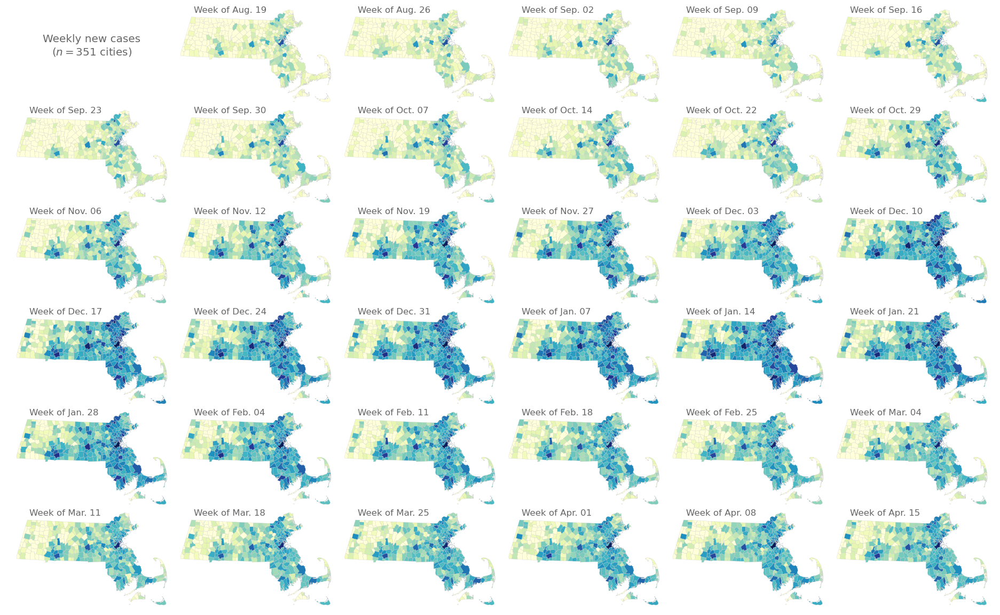

In [5]:
w = 4.0; h = 2.5
ncols = 6; nrows = 6
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=-0.05,hspace=-0.01)

for di, d in enumerate(list(city_df['date'].unique())[-int(nrows*ncols):]):
    aa = ax[tups[di]]
    if di != 0:
        aa = ax[tups[di]]
        dat_shp_i = dat_shp.copy()
        dat_shp_i = dat_shp_i.merge(city_df.loc[city_df['date']==d][['city','new_cases_town']],
                                    how='left', on='city')
        dat_shp_i['new_cases_town'] = np.log(np.nan_to_num(dat_shp_i['new_cases_town'])+1)
        dat_shp_i.plot(ax=aa, column='new_cases_town', ec='.8', lw=0.2, cmap='YlGnBu', vmin=0, vmax=7.5)
        d = "Week of "+month_dict[d[5:7]]+'. %s'%(d[8:])
        aa.text(0.125, 0.95, d, ha='left', va='center',
                transform=aa.transAxes, color='.4', fontsize='large')

    else:
        aa.text(0.5, 0.6, 'Weekly new cases\n($n=%i$ cities)'%city_df['city'].nunique(), color='.4',
                ha='center', va='center', transform=aa.transAxes, fontsize='x-large')

    aa.set_axis_off()

for dr in range(len(tups)-(di+1)):
    ax[tups[di + 1 + dr]].set_axis_off()

plt.savefig('../figs/pngs/ma_cities_casecounts_over_time.png',dpi=425,bbox_inches='tight')
plt.show()

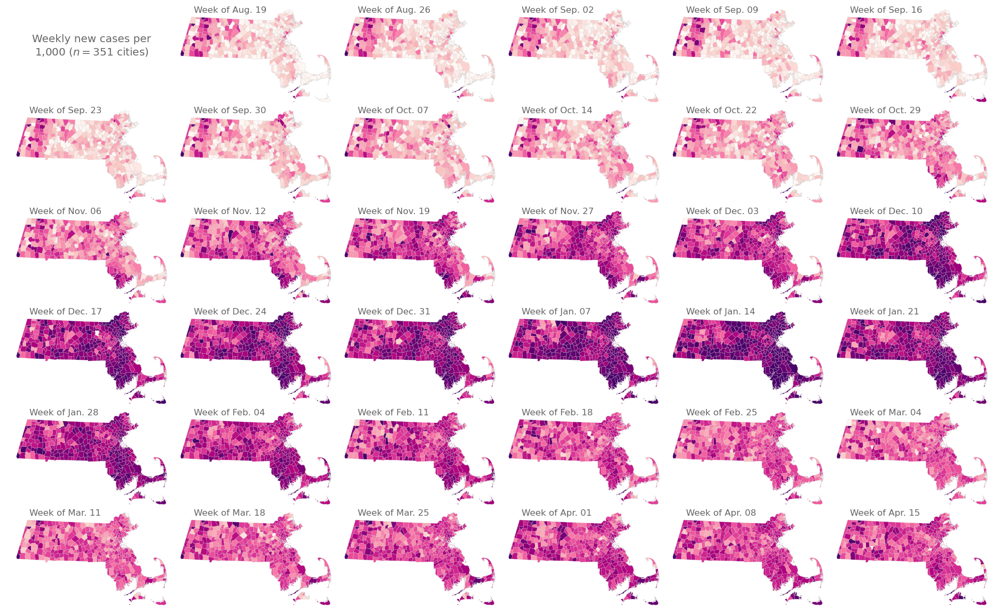

In [6]:
w = 4.0; h = 2.5
ncols = 6; nrows = 6
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=-0.05,hspace=-0.01)

for di, d in enumerate(list(city_df['date'].unique())[-int(nrows*ncols):]):
    aa = ax[tups[di]]
    if di != 0:
        aa = ax[tups[di]]
        dat_shp_i = dat_shp.copy()
        dat_shp_i = dat_shp_i.merge(city_df.loc[city_df['date']==d][['city','new_cases_town','population']],
                                    how='left', on='city')
        dat_shp_i['new_cases_town'] = np.nan_to_num(dat_shp_i['new_cases_town'])
        dat_shp_i['new_cases_town'] = np.log((dat_shp_i['new_cases_town']+1) / (dat_shp_i['population']+1) * 1000)
        dat_shp_i.plot(ax=aa, column='new_cases_town', ec='.8', lw=0.2, cmap='RdPu', vmin=-2.0, vmax=2.0)
        d = "Week of "+month_dict[d[5:7]]+'. %s'%(d[8:])
        aa.text(0.125, 0.95, d, ha='left', va='center',
                transform=aa.transAxes, color='.4', fontsize='large')

    else:
        aa.text(0.5, 0.6, 'Weekly new cases per\n1,000 ($n=%i$ cities)'%city_df['city'].nunique(), color='.4',
                ha='center', va='center', transform=aa.transAxes, fontsize='x-large')

    aa.set_axis_off()

for dr in range(len(tups)-(di+1)):
    ax[tups[di + 1 + dr]].set_axis_off()

plt.savefig('../figs/pngs/ma_cities_casecounts_per1000_over_time.png',dpi=425,bbox_inches='tight')

plt.show()

In [7]:
widx = 3
city_dfx = []
for city in city_df['city'].unique():
    cf = city_df.loc[city_df['city']==city].copy()
    cf['new_cases_town'] = np.nan_to_num(cf['new_cases_town'].rolling(window=widx).mean())
    city_dfx.append(cf)
    
city_dfx = pd.concat(city_dfx).reset_index().iloc[:,1:]

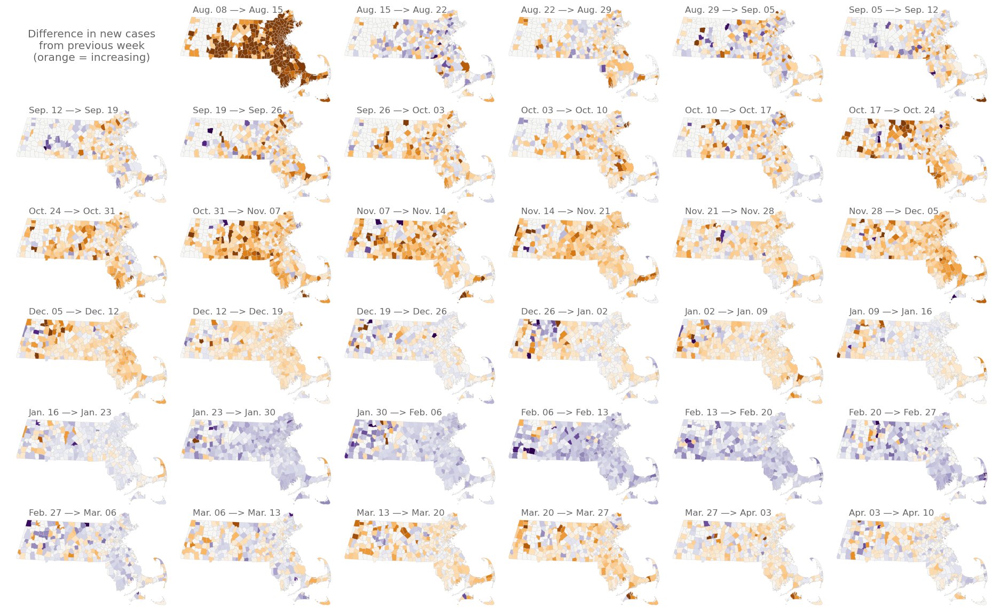

In [8]:
w = 4.0; h = 2.5
ncols = 6; nrows = 6
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=-0.05,hspace=-0.01)

for di, dcurr in enumerate(list(city_dfx['end_date'].unique())[-int(nrows*ncols):]):
    aa = ax[tups[di]]
    if di > 0:#widx-1:
        dprev = list(city_dfx['end_date'].unique())[-int(nrows*ncols):][di-1]
        dat_shp_i = dat_shp.copy()
        dat_shp_i = dat_shp_i.merge(city_dfx.loc[city_dfx['end_date']==dcurr][['city','new_cases_town']],
                        how='left', on='city').rename(columns={'new_cases_town':'new_cases_town_curr'})
        dat_shp_i['new_cases_town_curr'] = np.log(np.nan_to_num(dat_shp_i['new_cases_town_curr'])+1)
        dat_shp_i = dat_shp_i.merge(city_dfx.loc[city_dfx['end_date']==dprev][['city','new_cases_town']], 
                        how='left', on='city').rename(columns={'new_cases_town':'new_cases_town_prev'})
        dat_shp_i['new_cases_town_prev'] = np.log(np.nan_to_num(dat_shp_i['new_cases_town_prev'])+1)

        dat_shp_i['diff'] = dat_shp_i['new_cases_town_curr'] - dat_shp_i['new_cases_town_prev']

        dat_shp_i.plot(ax=aa, column='diff', ec='.8', lw=0.2, cmap='PuOr_r', vmin=-1.0, vmax=1.0)
        dprev = month_dict[dprev[5:7]]+'. %s'%(dprev[8:])
        dcurr = month_dict[dcurr[5:7]]+'. %s'%(dcurr[8:])
        aa.text(0.12, 0.95, dprev+" —> "+dcurr, ha='left', va='center',
                transform=aa.transAxes, color='.4', fontsize='large')
    elif di == 0:
        aa.text(0.5, 0.6, 'Difference in new cases\nfrom previous week\n(orange = increasing)',
                ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='x-large')
        
    aa.set_axis_off()

for dr in range(len(tups)-(di+1)):
    ax[tups[di + 1 + dr]].set_axis_off()


plt.savefig('../figs/pngs/ma_cities_casecounts_over_time_diff.png',dpi=425,bbox_inches='tight')

plt.show()

In [9]:
widx = 3
city_dfx = []
for city in city_df['city'].unique():
    cf = city_df.loc[city_df['city']==city].copy()
    cf['new_cases_town'] = np.nan_to_num(cf['new_cases_town'].rolling(window=widx).mean())
    cf['pct_new_cases_town'] = np.nan_to_num(cf['new_cases_town'].pct_change().rolling(window=widx).mean())
    city_dfx.append(cf)
    
city_dfx = pd.concat(city_dfx).reset_index().iloc[:,1:]
city_dfx['city'] = city_dfx['city'].str.upper()

In [10]:
from matplotlib import cm
import matplotlib

from scipy.stats import gaussian_kde
def kde_scipy(x, x_grid, bandwidth=0.2, **kwargs):
    """Kernel Density Estimation with Scipy"""
    # Note that scipy weights its bandwidth by the covariance of the
    # input data.  To make the results comparable to the other methods,
    # we divide the bandwidth by the sample standard deviation here.
    bandwidth = np.mean(np.diff(pct_bins))#/2
    kde = gaussian_kde(x, bw_method=bandwidth / x.std(ddof=1), **kwargs)
    return kde.evaluate(x_grid)

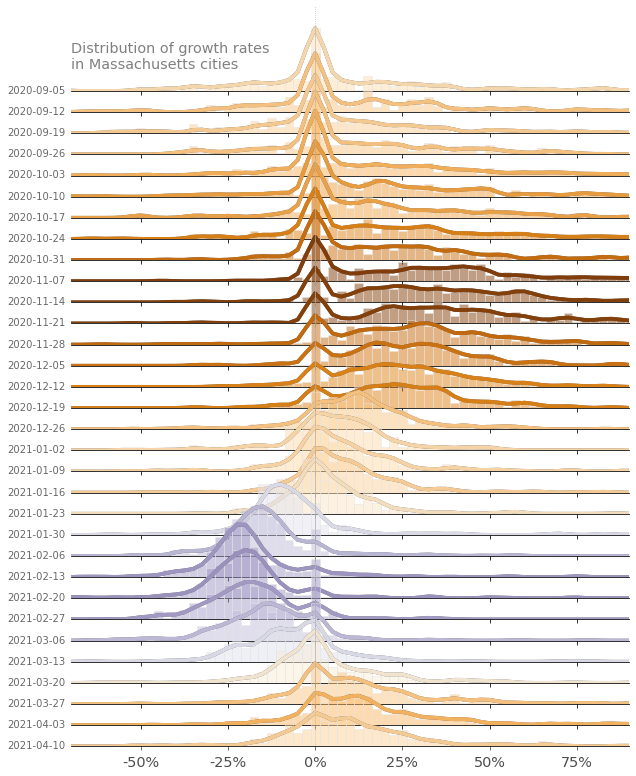

In [11]:
lw = 3
from matplotlib import gridspec
nrows = 32
dcus = city_dfx['end_date'].unique()[-nrows:]

gs = gridspec.GridSpec(nrows+1, 1)
fig = plt.figure(figsize=(10, 14))

i = 1

ax_objs = []
for tup in range(1,nrows+1):
    dcurr = dcus[tup-1]
    cf = city_dfx.loc[city_dfx['end_date']==dcurr][['city','pct_new_cases_town']].copy()
    pct_bins = np.linspace(-1, 1, 81)
    xvals = (pct_bins[1:]+pct_bins[:-1])/2
    xvals = pct_bins[:-1]
    bhd = kde_scipy(cf['pct_new_cases_town'].values, pct_bins)
    bhd = bhd/sum(bhd)
    bh = np.histogram(cf['pct_new_cases_town'], bins=pct_bins)[0]
    yvals_st = bh / sum(bh)
    yvals_st[yvals_st>max(bhd)] = max(bhd)
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))
    ymax_i = np.argmax(yvals_st)
    ymax = yvals_st[ymax_i]
    
    norm = matplotlib.colors.Normalize(vmin=-0.4, vmax=0.4)
    col_co = cm.PuOr_r(norm(np.mean(cf['pct_new_cases_town'])))
    ax_objs[-1].bar(xvals, yvals_st, ec='.9', lw=1,
           width=np.round(np.diff(xvals)[0],3), fc=col_co, alpha=0.5, zorder=nrows)
    ax_objs[-1].plot(pct_bins, bhd, color='.3', lw=lw*1.25, zorder=nrows+1)
    ax_objs[-1].plot(pct_bins, bhd, color=col_co, lw=lw*1.3, zorder=nrows+1, alpha=0.95)

    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    ax_objs[-1].set_yticks([])
    ax_objs[-1].set_yticklabels([])

    if i == nrows:
        ax_objs[-1].set_xticks([-1, -0.75, -0.5, -0.25, 0, .25, .5, .75, 1])
        ax_objs[-1].set_xticklabels(['-100%','-75%','-50%','-25%','0%','25%','50%','75%','100%'],fontsize='x-large')
        ax_objs[-1].tick_params(axis="x", pad=5, colors='.3')

    else:
        ax_objs[-1].set_xticks([-1, -0.75, -0.5, -0.25, 0, .25, .5, .75, 1])
        ax_objs[-1].set_xticklabels(['' for i in range(9)])

    ax_objs[-1].set_xlim(-0.7, 0.9)
    spines = ["top","right","left"]#,"bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)

    ax_objs[-1].text(-0.01,0.01,dcurr,transform=ax_objs[-1].transAxes,
                     fontsize='medium',va='center',ha="right",color='.4',alpha=0.99)
    ax_objs[-1].vlines(0, 0, 0.2, zorder=nrows+2, color='.7', linestyle=':', lw=0.75)
    ax_objs[-1].set_ylim(0, 0.2)

    i += 1

gs.update(hspace=-0.75)

fig.text(0.125,0.825,'Distribution of growth rates\nin Massachusetts cities',
               color='.5', fontsize='x-large', va='top', ha='left')

plt.savefig('../figs/pngs/ridgeplot_growthrate_dist.png', dpi=425, bbox_inches='tight')
plt.savefig('../figs/pdfs/ridgeplot_growthrate_dist.pdf', bbox_inches='tight')
plt.show()

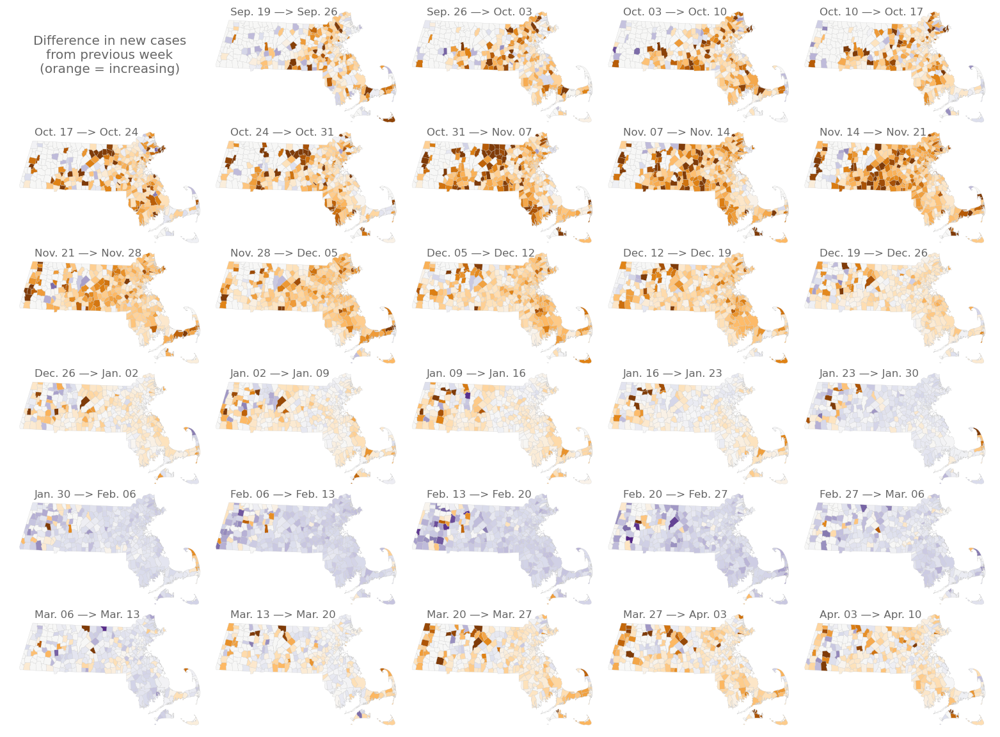

In [12]:
w = 4.0; h = 2.5
ncols = 5; nrows = 6
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=-0.05,hspace=-0.01)

for di, dcurr in enumerate(list(city_dfx['end_date'].unique())[-int(nrows*ncols):]):
    aa = ax[tups[di]]
    if di > 0:#widx-1:
        dprev = list(city_dfx['end_date'].unique())[-int(nrows*ncols):][di-1]
        dat_shp_i = dat_shp.copy()
        dat_shp_i = dat_shp_i.merge(city_dfx.loc[city_dfx['end_date']==dcurr][['city','pct_new_cases_town']],
                        how='left', on='city')
        dat_shp_i.plot(ax=aa, column='pct_new_cases_town', ec='.8', lw=0.2, cmap='PuOr_r', vmin=-1.0, vmax=1.0)
        dprev = month_dict[dprev[5:7]]+'. %s'%(dprev[8:])
        dcurr = month_dict[dcurr[5:7]]+'. %s'%(dcurr[8:])
        aa.text(0.12, 0.95, dprev+" —> "+dcurr, ha='left', va='center',
                transform=aa.transAxes, color='.4', fontsize='large')
    elif di == 0:
        aa.text(0.5, 0.6, 'Difference in new cases\nfrom previous week\n(orange = increasing)',
                ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='x-large')
        
    aa.set_axis_off()

for dr in range(len(tups)-(di+1)):
    ax[tups[di + 1 + dr]].set_axis_off()


plt.savefig('../figs/pngs/ma_cities_casecounts_over_time_pct_diff.png',dpi=425,bbox_inches='tight')

plt.show()

In [13]:
city_df['new_cases_per1000_town'] = city_df['new_cases_town'] / city_df['population'] * 1000

eligible_df = city_df.loc[(city_df['date']==city_df['date'].max())&\
                          (city_df['total_cases']>np.quantile(city_df['total_cases'],0.9))].copy()
rank_last4weeks = city_df.loc[(city_df['date'].isin(city_df['date'].unique()[-4:]))&\
                              (city_df['city'].isin(eligible_df['city'].values))].groupby('city').agg(
        {'new_cases_town':'mean'}).reset_index().sort_values('new_cases_town',ascending=False)

In [14]:
dates_tt = ['2020-07-01','2020-07-15','2020-08-01','2020-08-15',
            '2020-09-01','2020-09-15','2020-10-01','2020-10-15','2020-11-01','2020-11-15','2020-12-01','2020-12-15',
            '2021-01-01','2021-01-15','2021-02-01','2021-02-15','2021-03-01','2021-03-15','2021-04-01','2021-04-15']
dates_ll = ['Jul','','','','Sep','','','','Nov','','','','2021','','','','Mar','','Apr','']

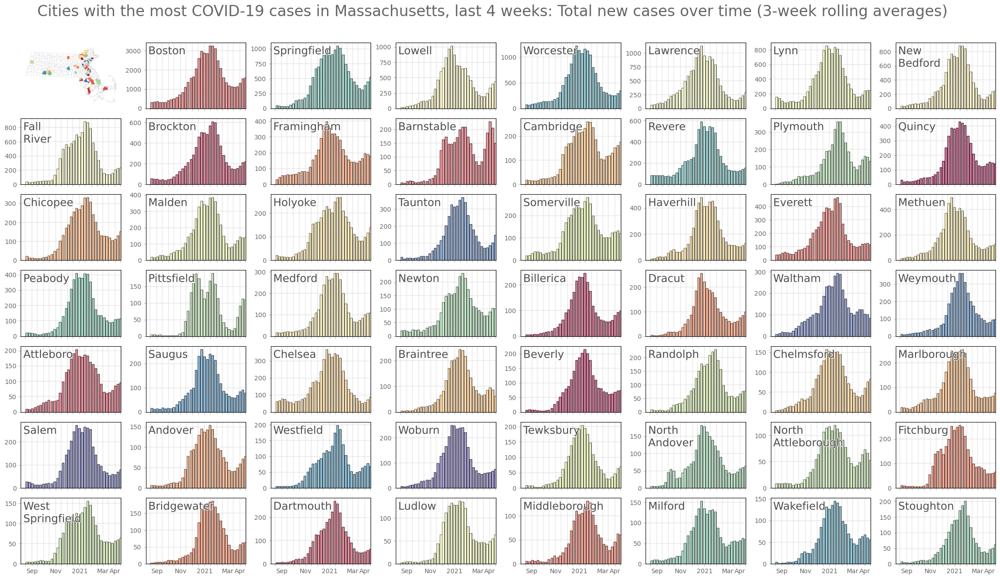

In [15]:
cmaa = plt.cm.Spectral

w = 3.5; h = 2.2
ncols = 8; nrows = 7
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=0.25,hspace=0.15)

dat_shp.plot(ax=ax[tups[0]], ec='.8', fc='none', lw=0.2)
dat_shp_i = dat_shp.loc[dat_shp['city'].isin(rank_last4weeks['city'].values[:(nrows*ncols)-1])].copy()
dat_shp_i = dat_shp_i.reset_index().iloc[:,1:]
dat_shp_i['col'] = list(range(dat_shp_i.shape[0]))
dat_shp_i.plot(ax=ax[tups[0]], ec='.8', lw=0.2, column='col', cmap=cmaa)
ax[tups[0]].set_axis_off()

cols = cmaa(dat_shp_i['col'].values/dat_shp_i['col'].max())
cols = dict(zip(dat_shp_i['city'].values,cols))

for ci, city_i in enumerate(rank_last4weeks['city'].values[:(nrows*ncols)-1]):
    aa = ax[tups[ci+1]]
    cti = city_df.loc[city_df['city']==city_i].copy()
    xvals_i = [date_dict[i] for i in cti['date']]
    yvals_i = cti['new_cases_per1000_town'].values
    yvals_i = cti['new_cases_town'].rolling(window=3).mean().values
    aa.bar(xvals_i, yvals_i, fc='w', ec='.2', width=5)
    aa.bar(xvals_i, yvals_i, fc=cols[city_i], ec='none',alpha=0.5, width=5)

    title_i = " ".join([i.capitalize() for i in city_i.split(' ')]).replace(' ','\n')

    aa.text(0.025,0.95,title_i,ha='left',va='top',transform=aa.transAxes,fontsize='xx-large',color='.3',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'), path_effects.Normal()])
    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='medium')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    if tups[ci+1][0] == nrows-1:
        aa.set_xticklabels(dates_ll)
    else:
        aa.set_xticklabels(['' for i in dates_ll])
        
    aa.set_xlim(date_dict[city_df['date'].min()]-1,date_dict[city_df['date'].max()]+1)

plt.suptitle('Cities with the most COVID-19 cases in Massachusetts, last 4 weeks: '+\
             'Total new cases over time (3-week rolling averages)', y=0.935, fontsize=24,
             color='.4')

plt.savefig('../figs/pngs/ma_cities_last4weeks_ranking.png',dpi=425,bbox_inches='tight')

plt.show()

In [16]:
heatm = []
city_order = city_df.loc[city_df['date']==city_df['date'].max()].sort_values('total_cases').city.values[::-1]
for ci, city_i in enumerate(city_order):
    cti = city_df.loc[city_df['city']==city_i].copy()
    yvals_i = cti['new_cases_per1000_town'].rolling(window=3).mean().values
    if sum(cti['new_cases_town'])>10:
        heatm.append(yvals_i)
    else:
        heatm.append(np.zeros(cti.shape[0]))

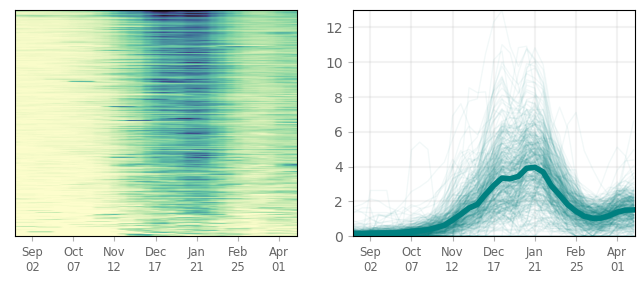

In [17]:
fig, ax = plt.subplots(1,2,figsize=(8,3),dpi=100)

ax[0].imshow(np.array(heatm),aspect='auto',vmin=0, vmax=10, cmap=cmo.cm.deep)
ax[1].plot(np.array(heatm).T, color='teal', alpha=0.05, lw=1)
ax[1].plot(np.mean(heatm,axis=0), color='teal', lw=4)
# ax.set_yticks(list(range(len(city_order)))[::10])
# ax.set_yticklabels(city_order[::10], fontsize='xx-small')
ax[0].set_yticks([])

ax[0].set_ylim(330,0)
ax[1].set_ylim(0,13)
ax[0].set_xlim(1.9,len(np.mean(heatm,axis=0))-0.85)
ax[1].set_xlim(1.9,len(np.mean(heatm,axis=0))-0.85)
ax[1].grid(linewidth=1.5,color='.75',alpha=0.2)
for a in fig.axes:
    a.tick_params(labelcolor='.4',color='.7',labelsize='medium')
    a.set_xticks([i for i in list(range(cti['date'].nunique()))[4::5]])
    a.set_xticklabels([month_dict[i[5:7]]+"\n%s"%i[8:] for i in cti['date'].unique()[4::5]],fontsize='small')

plt.savefig('../figs/pngs/ma_heatmap_city_cases.png',dpi=425,bbox_inches='tight')

plt.show()

In [18]:
city_df['city'] = city_df['city'].str.capitalize()

In [19]:
labs = dict(zip(contact_df['setting'].unique(),['24/7 Congr. Care', 'Child Care',
       'Higher Education', 'Corrections', 'Hospitals', 'Household',
       'Industr. Settings', 'K-12 Schools', 'Long Term Care',
       'Offices', 'Athletics/Camps', 'Other',
       'Other Food Estab.', 'Other Healthcare',
       'Other Workplace', 'Places of Worship', 'Rec./Cultural',
       'Restaurants', 'Retail/Services', 'Senior Living',
       'Shelters', 'Soc. Gatherings', 'Travel/Lodging']))

dates_tt = ['2020-11-01','2020-11-15','2020-12-01','2020-12-15',
            '2021-01-01','2021-01-15','2021-02-01','2021-02-15','2021-03-01','2021-03-15','2021-04-01','2021-04-15']
dates_ll = ['Nov','','Dec','','2021','','Feb','','Mar','','Apr','']

In [20]:
wid = 4
nw = 4
barw = 4.5

settings_order = contact_df.loc[contact_df['end_date'].isin(
                            sorted(contact_df['end_date'].unique())[-nw:])].copy()
settings_order = settings_order.groupby('setting').agg({'raw_new_cases':'sum'}).reset_index()
settings_order = settings_order.sort_values('raw_new_cases',ascending=False)['setting'].unique()
settings_order

array(['Household', 'Child Care', 'Organized Athletics & Camps',
       'Colleges & Universities', 'Long Term Care Facilities',
       'K-12 Schools', 'Social Gatherings', 'Restaurants & Food Courts',
       'Retail & Services', 'Hospitals', 'Industrial Settings',
       'Places of Worship', 'Offices', 'Recreation/Cultural',
       'Other Food Establishments', 'Other Workplaces',
       'Travel & Lodging', 'Senior Living', 'Other',
       '24/7 Congregate Settings', 'Other Healthcare', 'Shelters',
       'Corrections'], dtype=object)

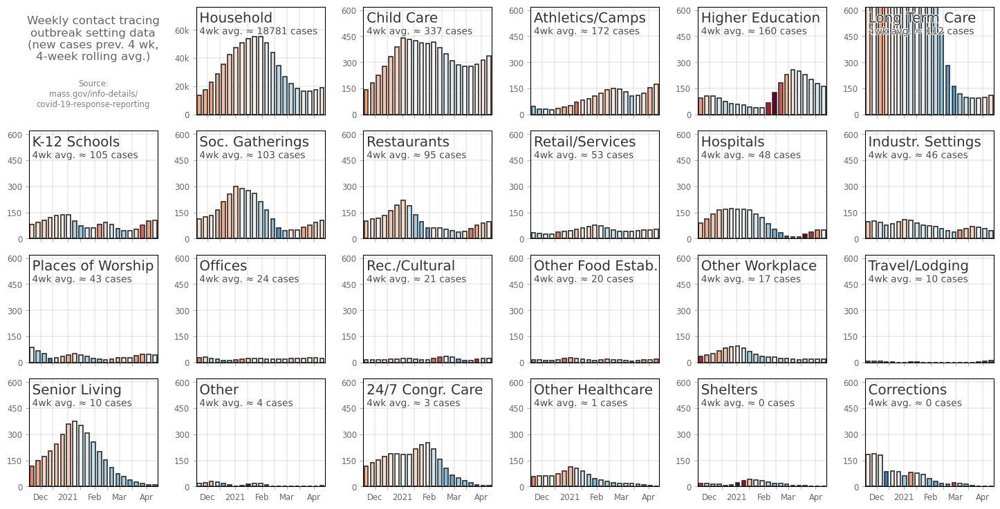

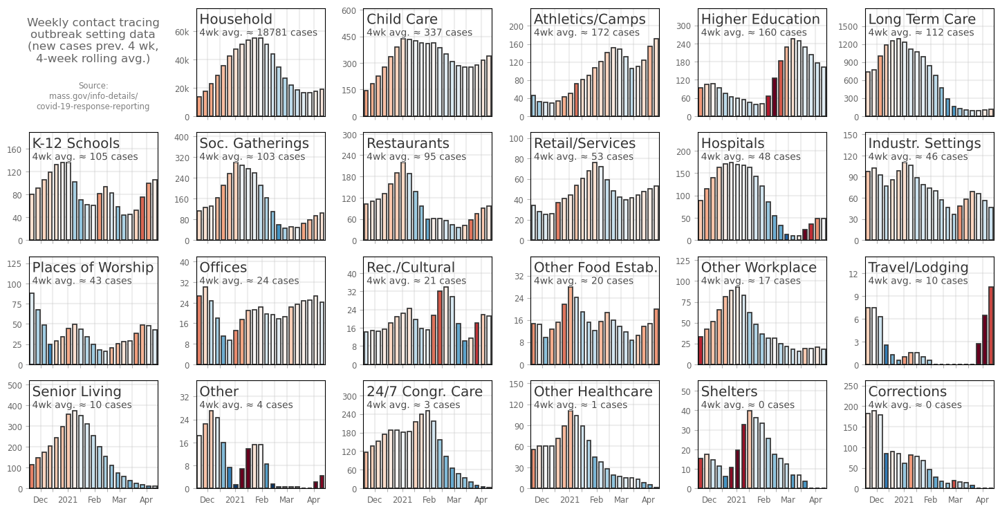

In [21]:
colum = 'raw_new_cases'
colab = 'new cases prev. 4 wk'
colim = 0.75

for samescale in ['samescale','diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = contact_df.loc[contact_df['setting']==dcurr].copy()
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        aa.text(0.025,0.815,'%iwk avg. ≈ %i %s'%(nw,four_wmean,colum.replace('raw_new_','')),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll)
        aa.set_xlim(date_dict[contact_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[contact_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

        if di == 1:
            aa.set_ylim(0, 76500)
            aa.set_yticks([0, 20000, 40000, 60000])
            aa.set_yticklabels(['0', '20k', '40k', '60k'])
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 620)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

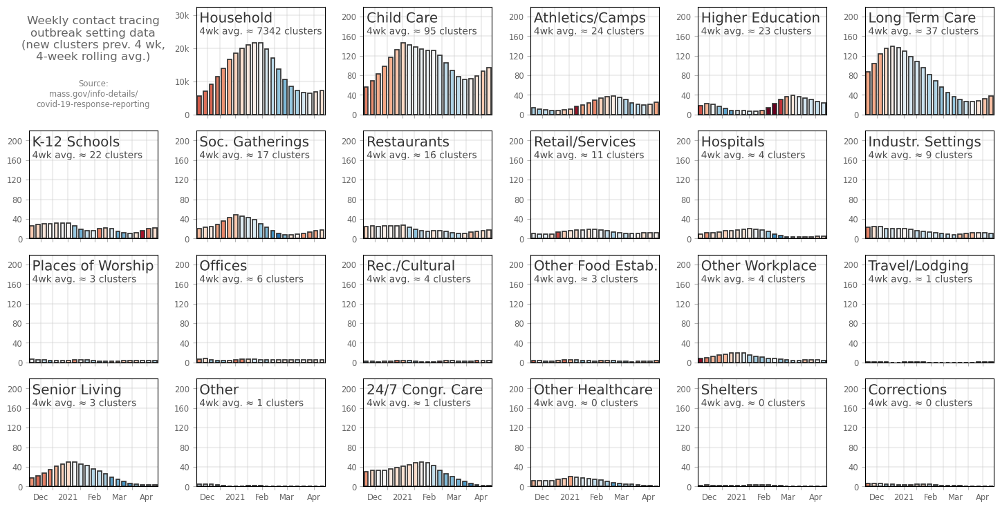

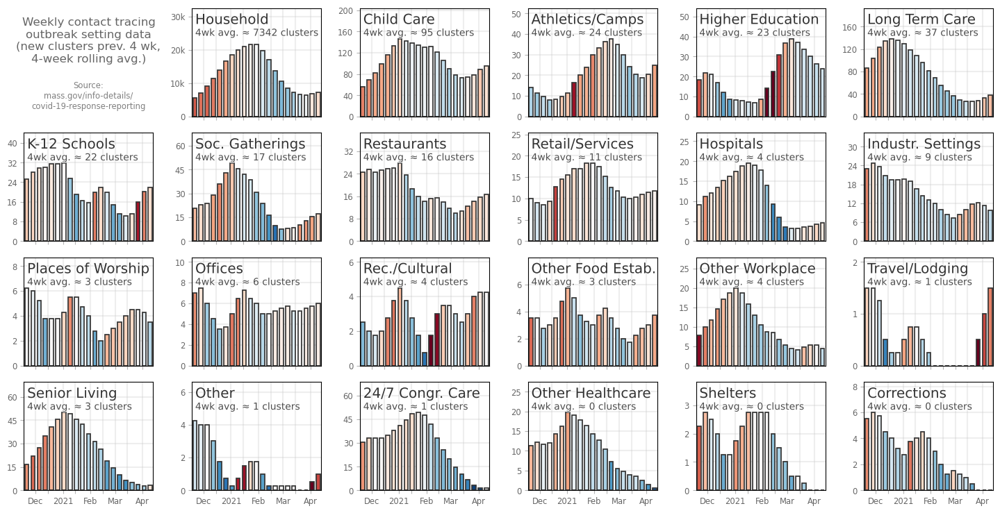

In [22]:
colum = 'raw_new_clusters'
colab = 'new clusters prev. 4 wk'
colim = 0.5

for samescale in ['samescale','diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = contact_df.loc[contact_df['setting']==dcurr].copy()
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        aa.text(0.025,0.815,'%iwk avg. ≈ %i %s'%(nw,four_wmean,colum.replace('raw_new_','')),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll)
        aa.set_xlim(date_dict[contact_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[contact_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

        if labs[dcurr]=='Household':
            aa.set_ylim(0, 32500)
            aa.set_yticks([0, 10000, 20000, 30000])
            aa.set_yticklabels(['0', '10k', '20k', '30k'])
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 220)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

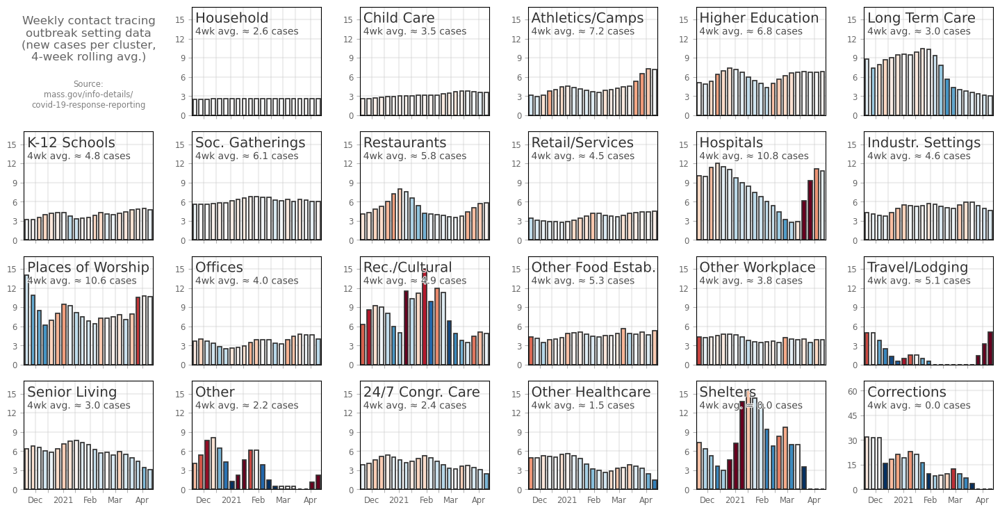

In [23]:
colum = 'raw_new_cases_per_cluster'
colab = 'new cases per cluster'
colim = 0.4
contact_df[colum] = contact_df['raw_new_cases'] / contact_df['raw_new_clusters']

for samescale in ['samescale']:#,'diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = contact_df.loc[contact_df['setting']==dcurr].copy()
        
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        aa.text(0.025,0.815,'%iwk avg. ≈ %.1f cases'%(nw,four_wmean),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll)
        aa.set_xlim(date_dict[contact_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[contact_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)

        if labs[dcurr]=='Corrections':
            aa.set_ylim(0, 66)
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 17)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

In [24]:
cont_dfs = []
n_init_attempts = 10000

for di, dcurr in enumerate(settings_order):
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()

    cti_tmp = cti[['start_date','raw_new_clusters','raw_new_cases','raw_total_clusters','raw_total_cases']].copy()
    pad_dates = DATERANGE[date_dict[cti['start_date'].min()]-21:][::7][:3]
    cti_tmp = pd.concat([pd.DataFrame({'start_date':pad_dates,
                                       'raw_new_clusters':[np.nan]*len(pad_dates),
                                       'raw_new_cases':[np.nan]*len(pad_dates),
                                       'raw_total_clusters':[np.nan]*len(pad_dates),
                                       'raw_total_cases':[np.nan]*len(pad_dates)}), cti_tmp])

    for colum in ['raw_new_clusters', 'raw_new_cases', 'raw_total_clusters', 'raw_total_cases']:
        out = []
        val = []
        for _ in range(n_init_attempts):
            init_val = cti_tmp[colum].values[3]
            tmp_vals = list(np.random.multinomial(int(init_val),
                            np.ones(len(pad_dates)+1)/(len(pad_dates)+1), size=1)[0])
            out.append(tmp_vals)
            for v in cti_tmp[colum].values[4:]:
                llx = v-sum(tmp_vals[-3:])
                tmp_vals.append(llx)

            val.append(sum([i if i<=0 else 0 for i in tmp_vals]))

        outx = out[np.argmin(val)]
        cti[colum.replace('raw_','')] = pd.Series(np.nan_to_num(outx)).rolling(window=4).mean().values[3:]
        cti[colum.replace('raw_','')] = [i if i > 0 else 0 for i in np.nan_to_num(cti[colum.replace('raw_','')])]

    cont_dfs.append(cti)

cont_df = pd.concat(cont_dfs).reset_index().iloc[:,1:]

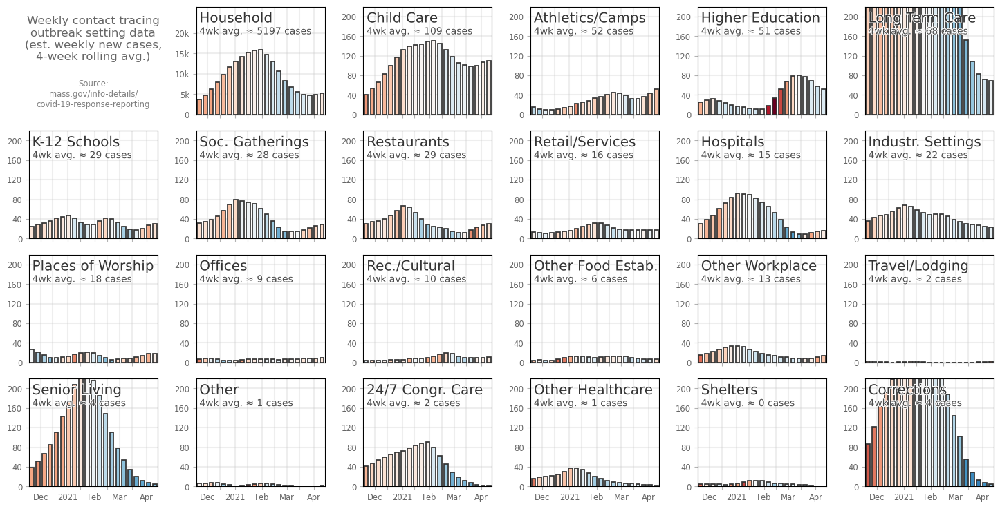

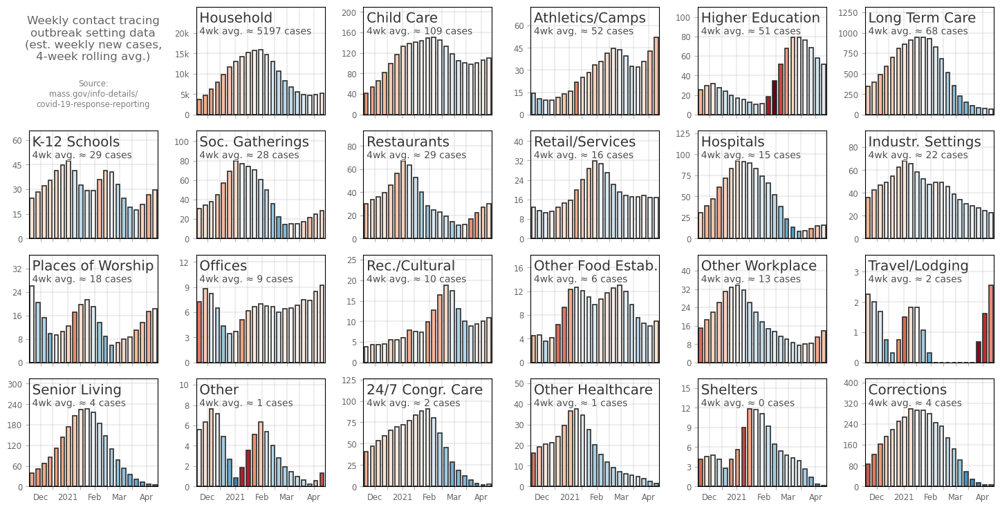

In [25]:
colum = 'total_cases'
colab = 'est. weekly new cases'
colim = 0.75

for samescale in ['samescale','diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = cont_df.loc[cont_df['setting']==dcurr].copy()
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        columL = colum.replace('raw_','')
        columL = columL.replace('new_','')
        columL = columL.replace('total_','')
        aa.text(0.025,0.815,'%iwk avg. ≈ %i %s'%(nw,four_wmean,columL),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll)
        aa.set_xlim(date_dict[cont_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[cont_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

        if di == 1:
            aa.set_ylim(0, 26500)
            aa.set_yticks([0, 5000, 10000, 15000,20000])
            aa.set_yticklabels(['0', '5k', '10k', '15k', '20k'])
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 220)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

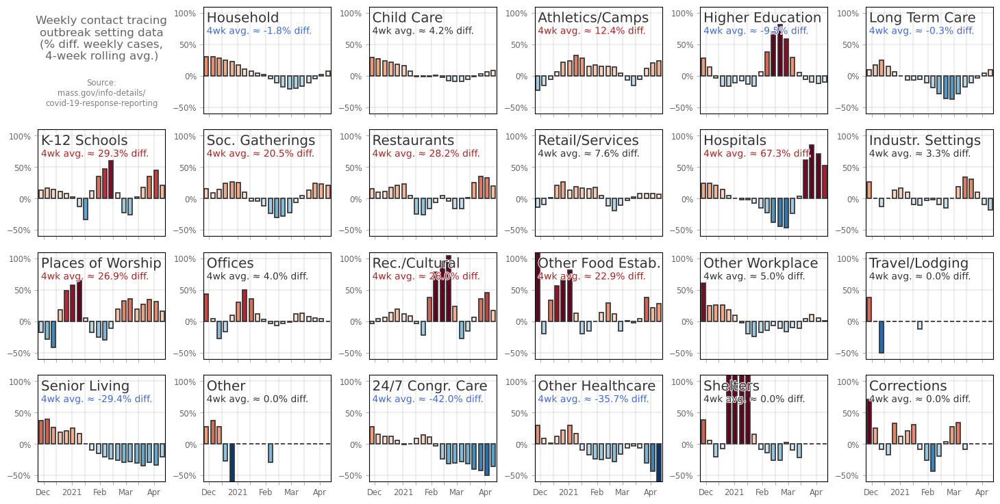

In [26]:
colum = 'new_cases'
colab = '% diff. weekly cases'
colim = 0.65

w = 3.0; h = 2.3
ncols = 6; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

for di, dcurr in enumerate(settings_order):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()

    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], np.nan_to_num(cti[colum].values[1:]),
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll)
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[5]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.6, 1.1)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change'),dpi=425,bbox_inches='tight')

plt.show()

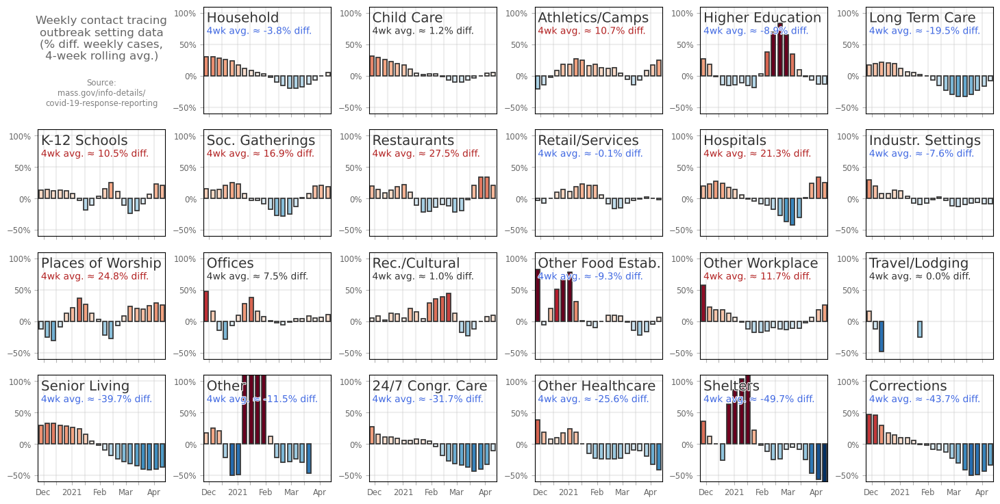

In [27]:
colum = 'total_cases'
colab = '% diff. weekly cases'
colim = 0.65

w = 3.0; h = 2.3
ncols = 6; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

for di, dcurr in enumerate(settings_order):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()

#     xx = cti[colum].diff()/cti[colum].rolling(window=int(wid/2)).mean()
#     xx.loc[np.abs(xx)==np.inf] = 0
#     xx.loc[xx.isna()] = 0
#     cti[colum] = xx
#     cti[colum] = cti[colum].rolling(window=wid).mean()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll)
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[5]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.6, 1.1)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change'),dpi=425,bbox_inches='tight')

plt.show()

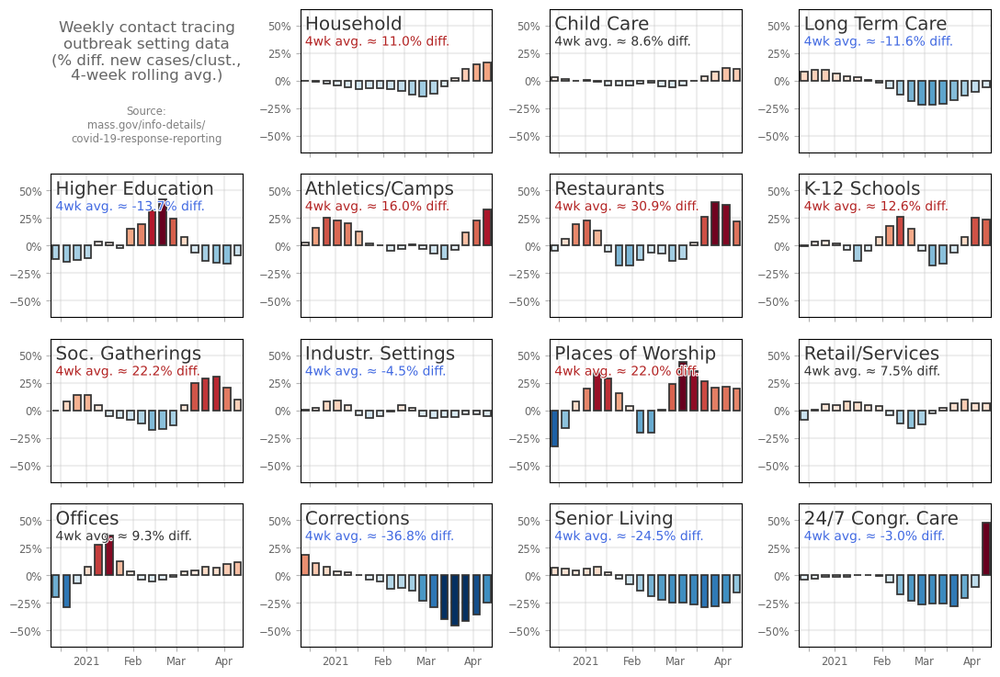

In [28]:
colum = 'new_cases_per_cluster'
colab = '% diff. new cases/clust.'
colim = 0.4
cont_df[colum] = cont_df['total_cases']/cont_df['total_clusters']
cont_df[colum] = cont_df['new_cases']/cont_df['new_clusters']
cont_df[colum] = cont_df['raw_new_cases']/cont_df['raw_new_clusters']
cont_df[colum] = cont_df['raw_total_cases']/cont_df['raw_total_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

tmp = ['Household', 'Child Care', 'Long Term Care Facilities',
       'Colleges & Universities', 'Organized Athletics & Camps',
       'Restaurants & Food Courts', 'K-12 Schools', 'Social Gatherings',
       'Industrial Settings', 'Places of Worship', 'Retail & Services',
#        'Other Workplaces', 
#  'Recreation/Cultural', 
       'Offices',
       'Corrections', 'Senior Living',# 'Other Food Establishments',
#        'Other Healthcare', 
       '24/7 Congregate Settings']#,
#        'Shelters']

for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()
#     cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
#     cti[colum] = np.nan_to_num(cti[colum])
#     cti[colum] = (cti[colum].diff()/cti[colum].rolling(window=wid).mean()).rolling(window=int(wid/2)).mean()
#     cti[colum] = cti[colum].rolling(window=wid).mean()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll)
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.65, 0.65)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change_raw'),dpi=425,bbox_inches='tight')

plt.show()

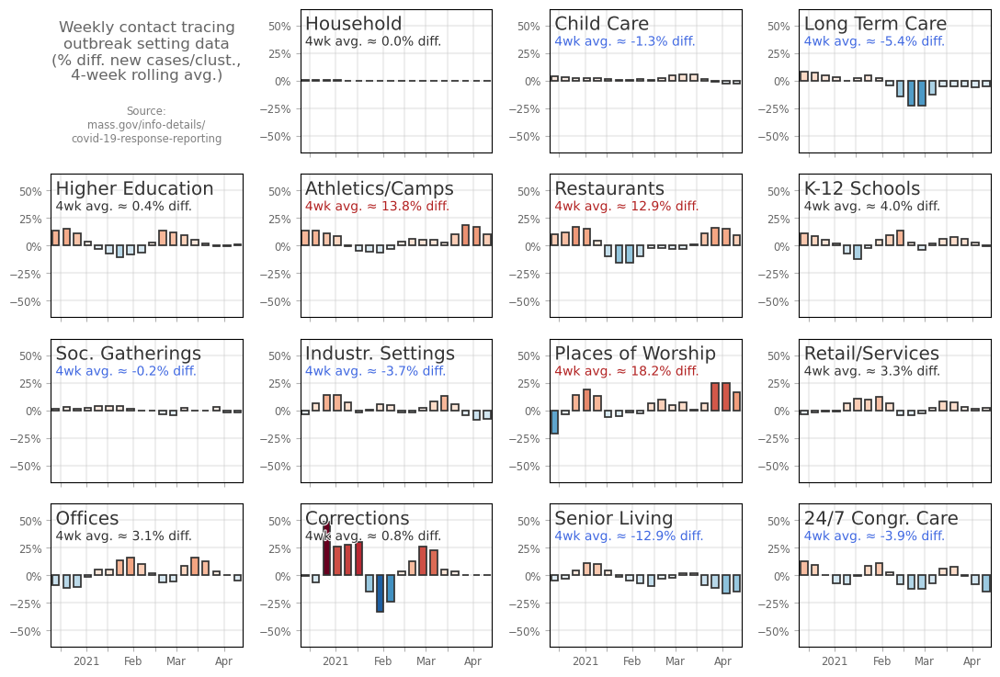

In [29]:
colum = 'new_cases_per_cluster'
colab = '% diff. new cases/clust.'
colim = 0.4
cont_df[colum] = cont_df['total_cases']/cont_df['total_clusters']
# cont_df[colum] = cont_df['new_cases']/cont_df['new_clusters']
cont_df[colum] = cont_df['raw_new_cases']/cont_df['raw_new_clusters']
# cont_df[colum] = cont_df['raw_total_cases']/cont_df['raw_total_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

tmp = ['Household', 'Child Care', 'Long Term Care Facilities',
       'Colleges & Universities', 'Organized Athletics & Camps',
       'Restaurants & Food Courts', 'K-12 Schools', 'Social Gatherings',
       'Industrial Settings', 'Places of Worship', 'Retail & Services',
#        'Other Workplaces', 
#  'Recreation/Cultural', 
       'Offices',
       'Corrections', 'Senior Living',# 'Other Food Establishments',
#        'Other Healthcare', 
       '24/7 Congregate Settings']#,
#        'Shelters']

for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()
#     cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
#     cti[colum] = np.nan_to_num(cti[colum])
#     cti[colum] = (cti[colum].diff()/cti[colum].rolling(window=wid).mean()).rolling(window=int(wid/2)).mean()
#     cti[colum] = cti[colum].rolling(window=wid).mean()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll)
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.65, 0.65)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change_tot'),dpi=425,bbox_inches='tight')

plt.show()

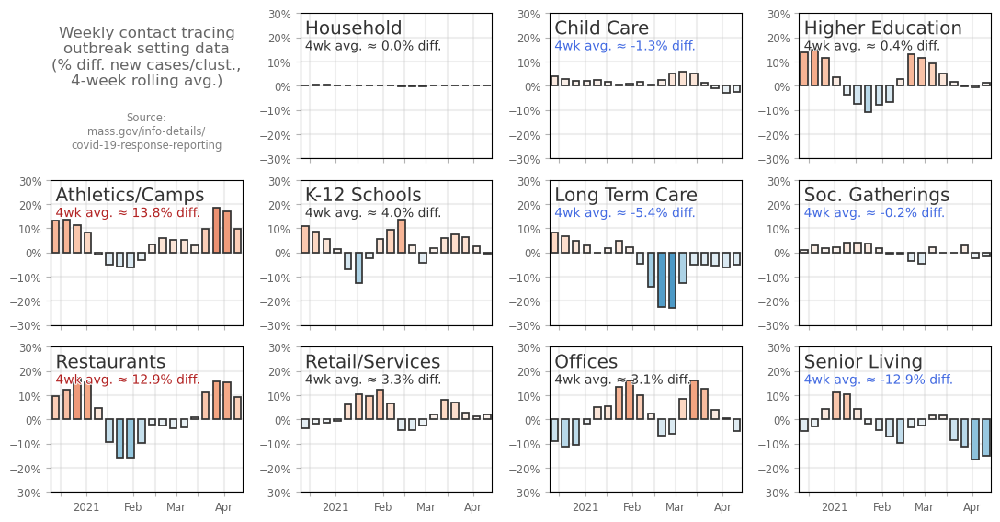

In [30]:
colum = 'new_cases_per_cluster'
colab = '% diff. new cases/clust.'
colim = 0.4
contact_df[colum] = contact_df['raw_new_cases']/contact_df['raw_new_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 3
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

tmp = ['Household', 'Child Care', 'Colleges & Universities', 'Organized Athletics & Camps',
       'K-12 Schools', 'Long Term Care Facilities', 'Social Gatherings',
       'Restaurants & Food Courts', 'Retail & Services', 'Offices', 'Senior Living']

for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll)
    aa.set_xlim(date_dict[contact_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[contact_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.3, 0.3)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_tmp'),dpi=425,bbox_inches='tight')

plt.show()

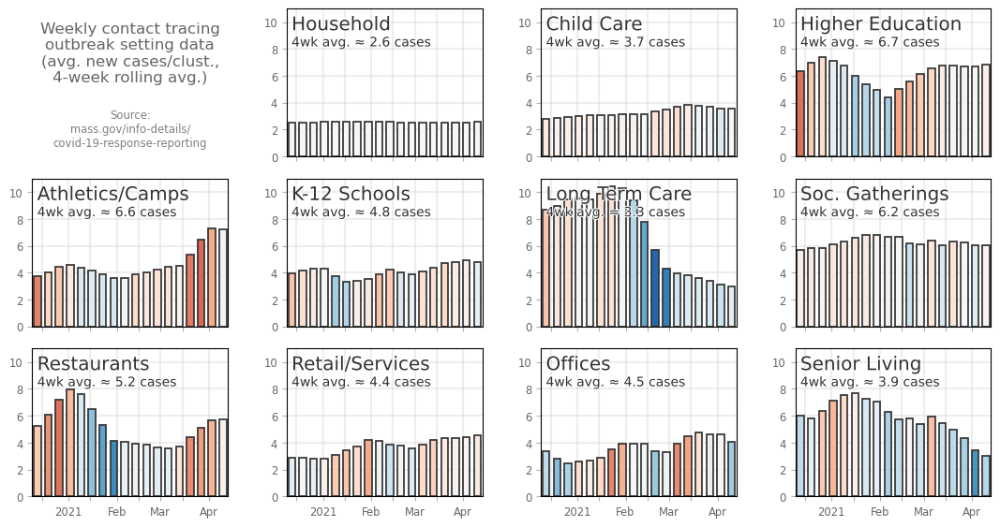

In [31]:
colum = 'new_cases_per_cluster'
colab = 'avg. new cases/clust.'
colim = 0.3
contact_df[colum] = contact_df['raw_new_cases']/contact_df['raw_new_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 3
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

wid = 4
for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
    col = plt.cm.RdBu_r(cvals)
    cti[colum] = cti[colum].rolling(window=wid).mean()

    aa.bar([date_dict[i] for i in cti['end_date'].values], cti[colum].values,
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f cases'%(nw,four_wmean),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll)
    aa.set_xlim(date_dict[contact_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[contact_df['end_date'].max()]+barw/2+1)

#     aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(0, 11)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'tmp'),dpi=425,bbox_inches='tight')

plt.show()

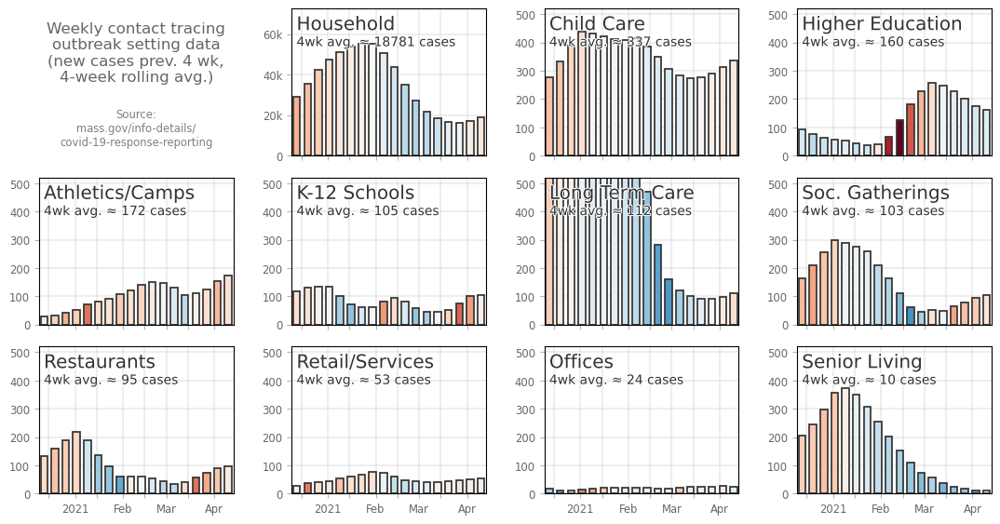

In [32]:
colum = 'raw_new_cases'
colab = 'new cases prev. 4 wk'
colim = 0.75

w = 3.3; h = 2.3
ncols = 4; nrows = 3
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

wid = 4
for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
    col = plt.cm.RdBu_r(cvals)
    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    cti[colum] = cti[colum].rolling(window=wid).mean()

    aa.bar([date_dict[i] for i in cti['end_date'].values], cti[colum].values,
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.text(0.025,0.815,'%iwk avg. ≈ %i cases'%(nw,int(four_wmean)),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll)
    aa.set_xlim(date_dict[contact_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[contact_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

    if di == 1:
        aa.set_ylim(0, 72500)
        aa.set_yticks([0, 20000, 40000, 60000])
        aa.set_yticklabels(['0', '20k', '40k', '60k'])
    else:
        aa.set_ylim(0,520)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'tmp'),dpi=425,bbox_inches='tight')

plt.show()

# Hospitalization

In [33]:
hosp_fn = 'https://healthdata.gov/api/views/anag-cw7u/rows.csv?accessType=DOWNLOAD'
hosp = pd.read_csv(hosp_fn, dtype={'fips_code':str,'zip':str})
hosp['collection_week'] = hosp.collection_week.astype(str).str[0:4] + '-' +\
                          hosp.collection_week.astype(str).str[5:7] + '-' +\
                          hosp.collection_week.astype(str).str[-2:]
hospx = hosp[['collection_week','state','hospital_name',
              'city','zip','fips_code']].copy()

In [34]:
adult_col = 'total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg'
child_col = 'total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg'
nrep = 500

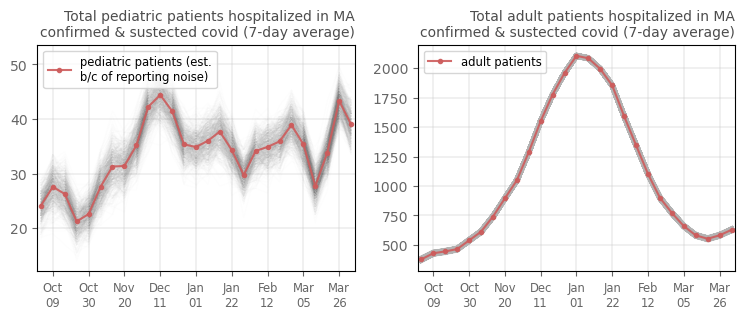

In [35]:
st = 'MA'
fig, ax = plt.subplots(1,2,figsize=(9,3),dpi=100)
adult_avg = []
child_avg = []
wid = 2

for xi in range(nrep):
    ma_hosp = hosp.loc[hosp['state']==st].copy()
    ma_hosp[adult_col] = [i if i != -999999.0 else np.random.randint(1,5) for i in ma_hosp[adult_col]]
    ma_hosp[child_col] = [i if i != -999999.0 else np.random.randint(1,5) for i in ma_hosp[child_col]]

    ma_hosp_g = ma_hosp.groupby(['collection_week']).agg({adult_col:np.nansum,
                                                          child_col:np.nansum}).reset_index()
    dates = [i for i in ma_hosp_g['collection_week'].values if i > '2020-10-01']
    ax[0].plot([date_dict[i] for i in dates],
         ma_hosp_g[child_col].rolling(window=wid).mean().values[-len(dates):],
         color='.5', lw=1, alpha=0.01, marker='')
    ax[1].plot([date_dict[i] for i in dates],
         ma_hosp_g[adult_col].rolling(window=wid).mean().values[-len(dates):],
         color='.7', lw=4, alpha=0.01, marker='')
    adult_avg.append(ma_hosp_g[adult_col].rolling(window=wid).mean().values[-len(dates):])
    child_avg.append(ma_hosp_g[child_col].rolling(window=wid).mean().values[-len(dates):])

ax[0].plot([date_dict[i] for i in dates], np.mean(child_avg,axis=0),
     color='indianred', lw=1.5, alpha=0.9, label='pediatric patients (est.\nb/c of reporting noise)',marker='.')
ax[1].plot([date_dict[i] for i in dates], np.mean(adult_avg,axis=0),
     color='indianred', lw=1.5, alpha=0.9, label='adult patients',marker='.')
        
ax[0].set_title('Total pediatric patients hospitalized in %s'%st+\
                '\nconfirmed & sustected covid (7-day average)',
             x=1,color='.3',ha='right',fontsize='medium')
ax[1].set_title('Total adult patients hospitalized in %s'%st+\
                '\nconfirmed & sustected covid (7-day average)',
             x=1,color='.3',ha='right',fontsize='medium')

for a in fig.axes:
    a.legend(loc=2, fontsize='small')
    a.set_xticks([date_dict[i] for i in dates[1::3]])
    a.set_xticklabels([month_dict[i[5:7]]+"\n%s"%i[8:] for i in dates[1::3]], fontsize='small')
    a.set_xlim(date_dict['2020-10-01']-1,
               date_dict[ma_hosp_g['collection_week'].values[-1]]+2)
    a.tick_params(labelcolor='.4', color='.4')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)

plt.savefig('../figs/pngs/pediatric_and_adult_%s.png'%st,dpi=425,bbox_inches='tight')
plt.show()    

In [36]:
ma_hosp = hosp.loc[hosp['state']==st].copy()
ma_hosp[child_col] = [i if i != -999999.0 else 1 for i in ma_hosp[child_col]]
ma_hosp_g = ma_hosp.groupby(['collection_week']).agg({adult_col:np.nansum,
                                                      child_col:np.nansum}).reset_index()

url_st_hosp = 'https://healthdata.gov/api/views/g62h-syeh/rows.csv?accessType=DOWNLOAD'
hosp_st = pd.read_csv(url_st_hosp)
hosp_st['date'] = pd.to_datetime(hosp_st['date']).astype(str)
hosp_st = hosp_st.loc[hosp_st['date']>'2020-07-15'].copy()
hosp_st = hosp_st.sort_values(['state','date']).reset_index().iloc[:,1:]

all_prev_cols = ['previous_day_admission_adult_covid_confirmed',
                 'previous_day_admission_adult_covid_suspected',
                 'previous_day_admission_pediatric_covid_confirmed',
                 'previous_day_admission_pediatric_covid_suspected']
adult_prev_cols = ['previous_day_admission_adult_covid_confirmed',
                   'previous_day_admission_adult_covid_suspected']
child_prev_cols = ['previous_day_admission_pediatric_covid_confirmed',
                   'previous_day_admission_pediatric_covid_suspected']
adult_total_cols = 'total_adult_patients_hospitalized_confirmed_and_suspected_covid'
child_total_cols = 'total_pediatric_patients_hospitalized_confirmed_and_suspected_covid'
total_cols = ['total_adult_patients_hospitalized_confirmed_and_suspected_covid',
              'total_pediatric_patients_hospitalized_confirmed_and_suspected_covid']

hosp_st['previous_day_admission_confirmed_and_suspected'] = hosp_st[all_prev_cols].sum(axis=1)
hosp_st['total_patients_confirmed_and_suspected_covid'] = hosp_st[total_cols].sum(axis=1)
hosp_st['previous_day_pediatric_admission_confirmed_and_suspected'] = hosp_st[child_prev_cols].sum(axis=1)
hosp_st['previous_day_adult_admission_confirmed_and_suspected'] = hosp_st[adult_prev_cols].sum(axis=1)
ma_hosp = hosp_st.loc[hosp_st['state']=='MA'].copy()
ma_hosp = ma_hosp.loc[ma_hosp['date']>'2020-09-01'].copy()

In [37]:
sch_dfg = school_df.groupby('date').agg({'new_cases_students':'sum',
                                         'new_cases_employee':'sum'}).reset_index()
sch_dfg = sch_dfg.merge(DATE_DF[['date','week']], how='left', on='date')

sch_dfg = pd.concat([sch_dfg,pd.DataFrame({'date':['2020-12-31'],'new_cases_students':[np.nan],
              'new_cases_employee':[np.nan],'week':[51]})]).sort_values('date').reset_index().iloc[:,1:]
sch_dfg.loc[sch_dfg['date']=='2021-02-18','new_cases_students'] = np.nan
sch_dfg.loc[sch_dfg['date']=='2021-02-18','new_cases_employee'] = np.nan

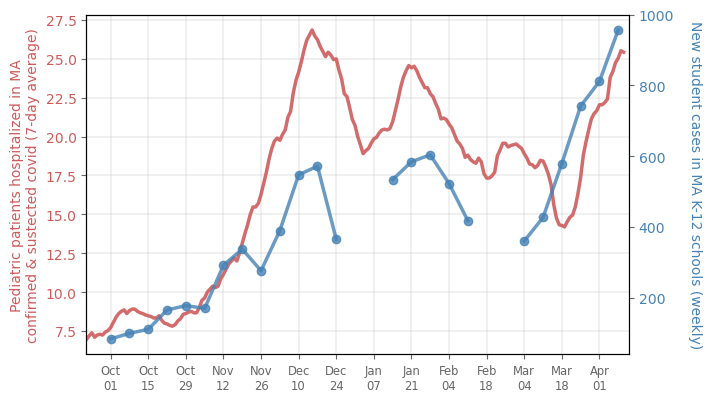

In [38]:
wx = 21
fig, ax = plt.subplots(1,1,figsize=(7,4.5),dpi=100)

ax.plot([date_dict[i] for i in ma_hosp['date']], 
        ma_hosp[child_total_cols].rolling(window=wx).mean(),
         color='indianred', lw=2.5, alpha=0.9, zorder=20)

ax2 = ax.twinx()
ax2.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_students'].rolling(window=2).mean(), marker='o',
        label='students', lw=2.5, color='steelblue', zorder=10, alpha=0.8)
ax2.tick_params(axis='x', labelcolor='.4', color='.4')
ax2.tick_params(axis='y', labelcolor='steelblue', color='.4')
ax2.set_ylabel('New student cases in MA K-12 schools (weekly)',
               color='steelblue', rotation=270, labelpad=20)

ax.set_ylabel('Pediatric patients hospitalized in MA'+\
              '\nconfirmed & sustected covid (7-day average)',
              color='indianred')

ax.set_xticks([date_dict[i] for i in sch_dfg['date'].values[1::2]])
ax.set_xticklabels([month_dict[i[5:7]]+"\n%s"%i[8:] for i in sch_dfg['date'].values[1::2]],
                   fontsize='small')
ax.set_xlim(date_dict['2020-09-21']+wid-1,
            date_dict[ma_hosp['date'].values[-1]]+2)
ax.tick_params(axis='x', labelcolor='.4', color='.4')
ax.tick_params(axis='y', labelcolor='indianred', color='.4')
ax.grid(linewidth=1.25,color='.75',alpha=0.25)
ax.set_ylim(6)
# ax2.set_ylim(0)

plt.savefig('../figs/pngs/pediatric_hosp_ma_schools.png',dpi=425,bbox_inches='tight')
plt.show()    

_________________

# Schools

In [39]:
city_dfg = city_df.groupby('date').agg({'new_cases_town':np.nansum}).reset_index()
city_dfg = city_dfg.loc[(city_dfg['date']>=sch_dfg['date'].min())].copy()

In [40]:
dates_tt = ['2020-09-01','2020-10-01','2020-11-01','2020-12-01','2021-01-01','2021-02-01','2021-03-01','2021-04-01']
dates_ll = ['Sep','Oct','Nov','Dec','2021','Feb','Mar','Apr']

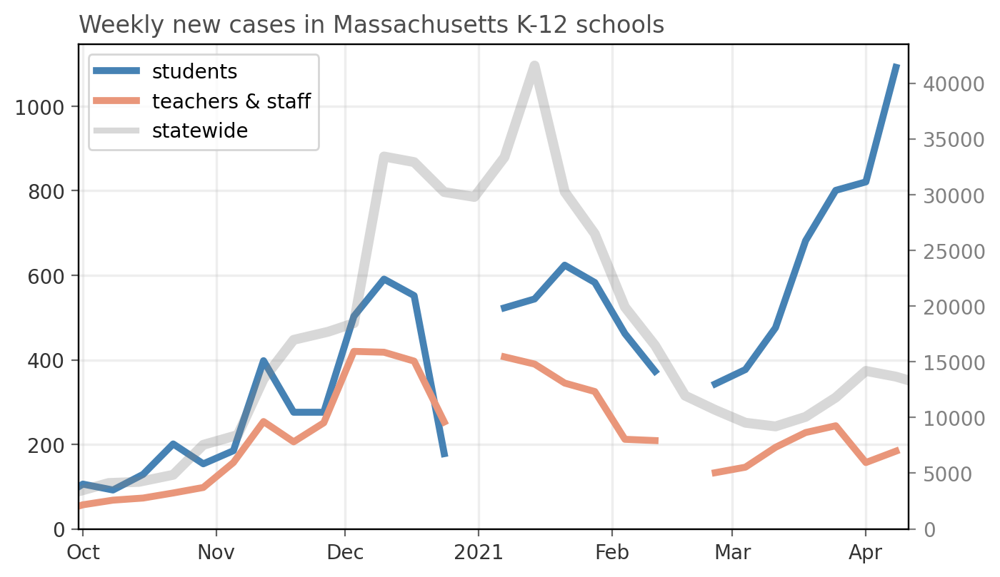

In [41]:
wid = 1
fig, ax = plt.subplots(1,1, figsize=(7.5, 4.5), dpi=200)

cols = ['steelblue','darksalmon']

ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_students'].rolling(window=wid).mean().values,
        label='students', lw=3.5, color=cols[0], zorder=100)
ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_employee'].rolling(window=wid).mean().values,
        label='teachers & staff', lw=3.5, color=cols[1], zorder=100)

ax.plot([-100,-101],[-1,-1],lw=3,color='.5',alpha=0.3,
        label='statewide')

ax2 = ax.twinx()
ax2.plot([date_dict[i] for i in city_dfg['date']],
          city_dfg['new_cases_town'].rolling(window=wid).mean().values,
         lw=5,color='.5',alpha=0.3)
ax2.tick_params(labelcolor='.5', color='.5')

dates = [i for i in date_dict.keys() if i > '2020-09-26'][4::14]
ax.set_xticks([date_dict[i] for i in dates_tt])
ax.set_xticklabels(dates_ll)
ax.set_xlim(date_dict[sch_dfg['date'].min()]-1+7,date_dict[sch_dfg['date'].max()]+3)

ax.legend(loc=2)
ax.tick_params(labelcolor='.2', color='.4')
ax.grid(linewidth=1.25,color='.75',alpha=0.25)
ax.set_ylim(0)
ax2.set_ylim(0)

ax.set_title('Weekly new cases in Massachusetts K-12 schools',
             x=0,color='.3',ha='left')

plt.savefig('../figs/pngs/ma_k12_schools',dpi=425,bbox_inches='tight')
plt.show()

In [42]:
city_dfg = city_dfg.merge(DATE_DF[['date','week']], how='left', on='date')
ma_dfg = sch_dfg.merge(city_dfg[['week','new_cases_town']])

In [43]:
ma_dfg['date'] = [DATERANGE[date_dict[i]+6] for i in ma_dfg['date']]

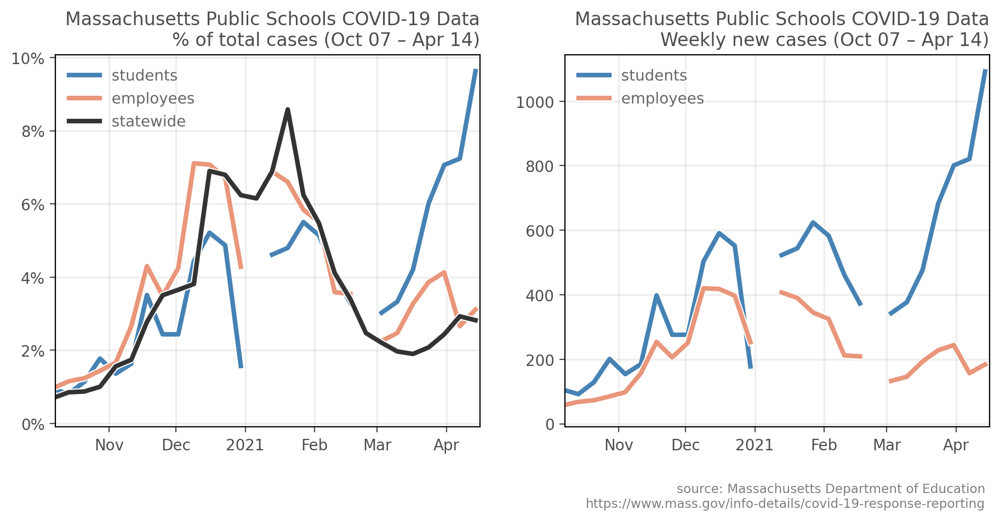

In [44]:
wid = 1
lw = 3
fig, ax = plt.subplots(1,2,figsize=(11,4.5),dpi=200)

labs_tx = ['students','employees','statewide']
cols = ['steelblue','darksalmon','.2']
for ci, col in enumerate(['new_cases_students','new_cases_employee','new_cases_town']):
    xvals_i = [date_dict[i] for i in ma_dfg['date'].values]
    yvals_i = ma_dfg[col].rolling(window=wid).mean().values
    ax[0].plot(xvals_i, yvals_i/np.nansum(yvals_i), label=labs_tx[ci], lw=lw, color=cols[ci],
            path_effects=[path_effects.Stroke(linewidth=lw*1.5, foreground='w'),
                          path_effects.Normal()])
    if ci < 2:
        yvals_i = ma_dfg[col].rolling(window=wid).mean().values
        ax[1].plot(xvals_i, yvals_i, label=labs_tx[ci], lw=lw, color=cols[ci],
                path_effects=[path_effects.Stroke(linewidth=lw*1.5, foreground='w'),
                              path_effects.Normal()])


ax[0].set_ylim(-0.001)
ax[1].set_ylim(-10)

ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
tlabs = ['% of total cases '+\
              '(%s %s – %s %s)'%(month_dict[ma_dfg['date'].min()[5:7]],
                                 ma_dfg['date'].min()[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),
        'Weekly new cases '+\
              '(%s %s – %s %s)'%(month_dict[ma_dfg['date'].min()[5:7]],
                                 ma_dfg['date'].min()[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),]

for ai,a in enumerate(fig.axes):
    a.set_xticks([date_dict[i] for i in dates_tt])
    a.set_xticklabels(dates_ll)
    l = a.legend(loc=2, ncol=1, framealpha=0)
    for text in l.get_texts():
        text.set_color('.4')
        text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='w'),
                               path_effects.Normal()])

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_title('Massachusetts Public Schools COVID-19 Data\n'+tlabs[ai],
                x=1,color='.3',ha='right')
    a.set_xlim(date_dict[ma_dfg['date'].min()]+1,
                date_dict[ma_dfg['date'].max()]+2)

ax[1].text(0.99,-0.15,'source: Massachusetts Department of Education\n'+\
        'https://www.mass.gov/info-details/covid-19-response-reporting',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[1].transAxes)


plt.savefig('../figs/pngs/massachusetts_k12_studentstaff.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_k12_studentstaff.pdf',bbox_inches='tight')
plt.show()

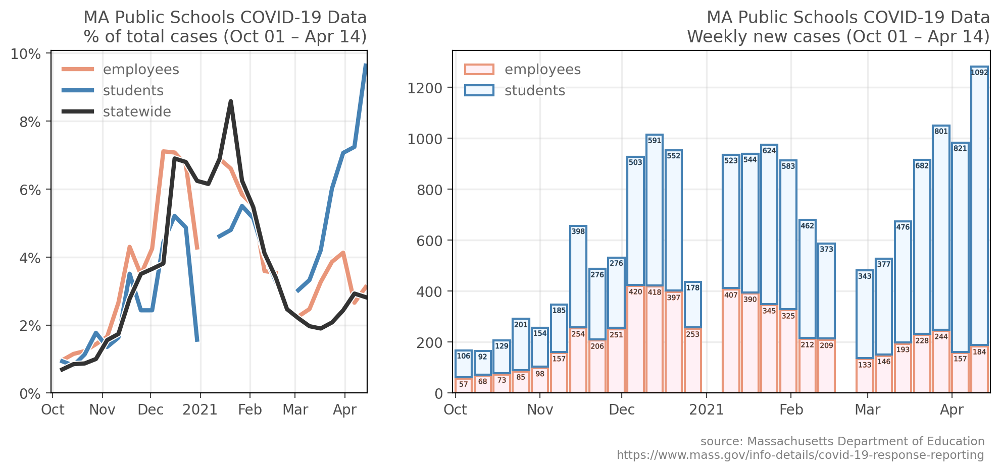

In [45]:
wid = 1
lw = 3
fig, ax = plt.subplots(1,2,figsize=(12,4.5),dpi=200,gridspec_kw={'width_ratios':[1,1.7]})

labs_tx = ['employees','students','statewide']
cols = ['darksalmon','steelblue','.2']
cols2 = ['lavenderblush','aliceblue','.2']
bbot = np.zeros(ma_dfg.shape[0])
width = 6
for ci, col in enumerate(['new_cases_employee','new_cases_students','new_cases_town']):
    xvals_i = np.array([date_dict[i] for i in ma_dfg['date'].values])
    yvals_i = ma_dfg[col].rolling(window=wid).mean().values
    ax[0].plot(xvals_i, yvals_i/np.nansum(yvals_i), label=labs_tx[ci], lw=lw, color=cols[ci],
            path_effects=[path_effects.Stroke(linewidth=lw*1.5, foreground='w'),
                          path_effects.Normal()])
    if ci < 2:
        yvals_i = ma_dfg[col].rolling(window=wid).mean().values
        ax[1].bar(xvals_i-3, yvals_i, bottom=bbot, label=labs_tx[ci], lw=1.5, color=cols2[ci],
                  width=width, ec=cols[ci])
        for xi,x in enumerate(ma_dfg[col]):
            if np.nan_to_num(x) != 0:
                ax[1].text(xvals_i[xi]-3, x+bbot[xi]-10, int(x), ha='center', va='top',
                           fontsize=5,color='.2',#cols[ci],#fontweight='bold',
                           path_effects=[path_effects.Stroke(linewidth=0.35, foreground=cols[ci]),
                                         path_effects.Normal()])

        bbot += yvals_i + 5


ax[0].set_ylim(-0)
ax[1].set_ylim(-0)

mind = DATERANGE[date_dict[ma_dfg['date'].min()]-6]
ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
tlabs = ['% of total cases '+\
              '(%s %s – %s %s)'%(month_dict[mind[5:7]],
                                 mind[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),
        'Weekly new cases '+\
              '(%s %s – %s %s)'%(month_dict[mind[5:7]],
                                 mind[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),]

for ai,a in enumerate(fig.axes):
    a.set_xticks([date_dict[i] for i in dates_tt])
    a.set_xticklabels(dates_ll)
    l = a.legend(loc=2, ncol=1, framealpha=0)
    for text in l.get_texts():
        text.set_color('.4')
        text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='w'),
                               path_effects.Normal()])

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_title('MA Public Schools COVID-19 Data\n'+tlabs[ai],
                x=1,color='.3',ha='right')
    a.set_xlim(date_dict[ma_dfg['date'].min()]-7,
#     a.set_xlim(date_dict[ma_dfg['date'].min()]+14,
               date_dict[ma_dfg['date'].max()]+1)

ax[1].text(0.99,-0.125,'source: Massachusetts Department of Education\n'+\
        'https://www.mass.gov/info-details/covid-19-response-reporting',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[1].transAxes)


plt.savefig('../figs/pngs/massachusetts_k12_studentstaff_bar.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_k12_studentstaff_bar.pdf',bbox_inches='tight')
plt.show()

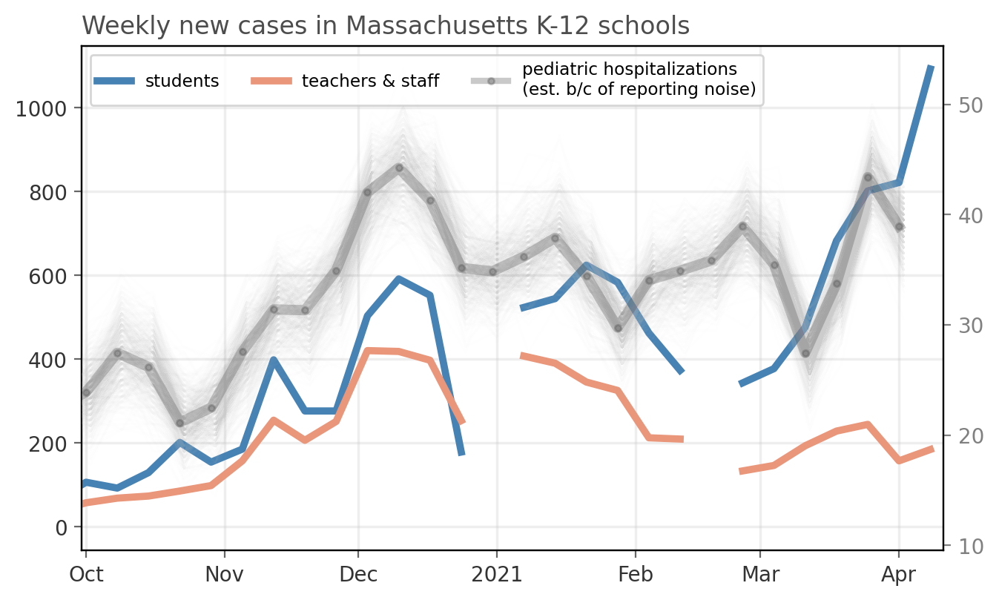

In [46]:
wid = 2
fig, ax = plt.subplots(1,1, figsize=(7.5, 4.5), dpi=200)

cols = ['steelblue','darksalmon']

ax2 = ax.twinx()
child_avg = []
for xi in range(500):
    ma_hosp = hosp.loc[hosp['state']==st].copy()
    ma_hosp[child_col] = [i if i != -999999.0 else np.random.randint(1,5) for i in ma_hosp[child_col]]

    ma_hosp_g = ma_hosp.groupby(['collection_week']).agg({child_col:np.nansum}).reset_index()
    dates = [i for i in ma_hosp_g['collection_week'].values]

    ax2.plot([date_dict[i] for i in dates],ma_hosp_g[child_col].rolling(window=wid).mean().values,
             color='.8', lw=1, alpha=0.02, marker='',zorder=10)
    child_avg.append(ma_hosp_g[child_col].rolling(window=wid).mean().values)

tmp = ma_hosp_g.merge(DATE_DF.rename(columns={'date':'collection_week'}),
                      how='left', on='collection_week')
tmp['pediatric_hosp'] = np.mean(child_avg,axis=0)
tmp = tmp.rename(columns={'collection_week':'date'})
child_hosp = tmp[['date','week','pediatric_hosp']].copy()
sch_dfg_hosp = sch_dfg.merge(child_hosp[['week','pediatric_hosp']], how='left', on='week')

ax2.plot([date_dict[i] for i in sch_dfg_hosp['date']],
         sch_dfg_hosp['pediatric_hosp'].values,
         color='.3',lw=5,alpha=0.3,marker='.',zorder=11)
ax2.tick_params(labelcolor='.5', color='.5')

ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_students'].values,
        label='students', lw=3.5, color=cols[0], zorder=100)
ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_employee'].values,
        label='teachers & staff', lw=3.5, color=cols[1], zorder=100)
ax.plot([-100,-101],[-1,-1],lw=3,color='.3',alpha=0.3,marker='.',
        label='pediatric hospitalizations\n(est. b/c of reporting noise)')

dates = [i for i in date_dict.keys() if i > '2020-09-26'][4::14]
ax.set_xticks([date_dict[i] for i in dates_tt])
ax.set_xticklabels(dates_ll)
ax.set_xlim(date_dict[sch_dfg['date'].min()]-1+7,date_dict[sch_dfg['date'].max()]+3)

ax.legend(loc=2, ncol=3, fontsize='small')
ax.tick_params(labelcolor='.2', color='.4')
ax.grid(linewidth=1.25,color='.75',alpha=0.25)
# ax.set_ylim(0)
# ax2.set_ylim(0)

ax.set_title('Weekly new cases in Massachusetts K-12 schools',
             x=0,color='.3',ha='left')

plt.savefig('../figs/pngs/ma_k12_schools_hosp',dpi=425,bbox_inches='tight')
plt.show()

_________________

In [47]:
mass_data = client.open("COVID-data_Massachusetts")
vaccine_city_age_data = mass_data.worksheet('vaccine_city_age')

vax_age_dfx = pd.DataFrame(vaccine_city_age_data.get_all_records(default_blank=np.nan))
vax_age_df = vax_age_dfx.loc[vax_age_dfx['age_group']!='Total'][['date', 'county', 'city', 'age_group', 'population', 
       'atleast_onedose', 'fully_vaccinated','partially_vaccinated']].copy()

tots = vax_age_dfx.loc[vax_age_dfx['age_group']!='Total'].groupby(['date','county','city']).agg({'population':'sum', 
                                                            'atleast_onedose':'sum',
                                                            'fully_vaccinated':'sum',
                                                            'partially_vaccinated':'sum'}).reset_index()
tots['age_group'] = 'Total'

vax_age_df = pd.concat([vax_age_df.drop_duplicates(),tots])

vax_age_dfg = vax_age_df.groupby(['date','age_group']).agg({'population':'sum', 
                                                            'atleast_onedose':'sum',
                                                            'fully_vaccinated':'sum',
                                                            'partially_vaccinated':'sum'}).reset_index()

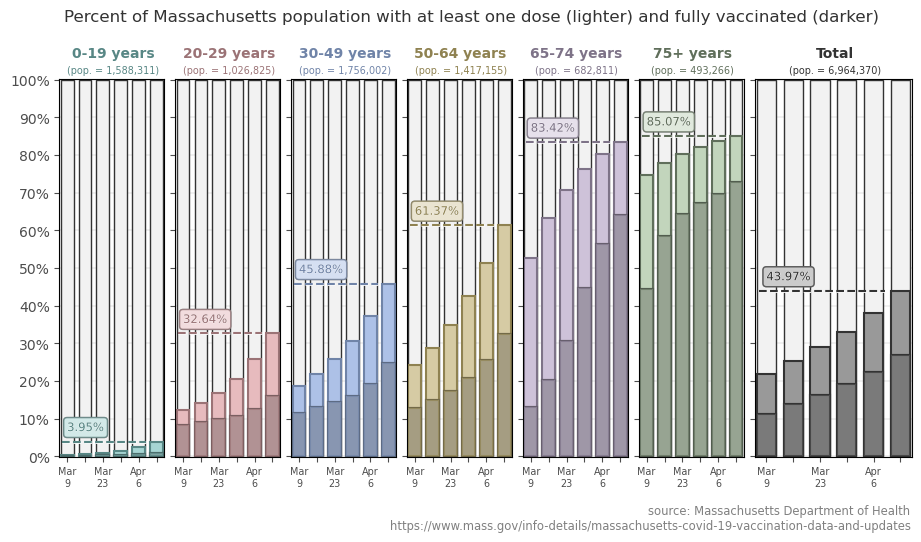

In [48]:
fig, ax = plt.subplots(1,vax_age_dfg['age_group'].nunique(),figsize=(11,5),dpi=100,sharey=True,sharex=True,
                       gridspec_kw={'width_ratios':[1]*(vax_age_dfg['age_group'].nunique()-1)+[1.5]})
plt.subplots_adjust(wspace=0.1)

colors = plt.cm.Pastel1_r(np.linspace(0,1,vax_age_dfg['age_group'].nunique()-1))
colors = ["#a6d5d3","#e7bbbe","#adc1e7","#d6cba4","#cec2d9","#c2d5bc"] + ['.6']
color_d = ["#588785","#9b7376","#7084a8","#8f8251","#7e7388","#606f5b"]+['.2']

for ai,ag in enumerate(vax_age_dfg['age_group'].unique()):
    vig = vax_age_dfg.loc[vax_age_dfg['age_group']==ag].copy()
    
    ax[ai].bar([date_dict[i] for i in vig['date']], 1,
           fc='.95', ec='.2', width=5, linestyle='-', lw=1)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['atleast_onedose']/vig['population']).tolist(),
               width=5, ec=color_d[ai], color=colors[ai], lw=1.5)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, color='.2', lw=1.5, ec='.2')
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, ec=color_d[ai], alpha=0.7, color=colors[ai], lw=1.5)

    vmax = (vig['atleast_onedose']/vig['population']).max()
    ax[ai].hlines(vmax, date_dict[vax_age_dfg['date'].min()]-2, date_dict[vax_age_dfg['date'].max()]-4,
                  lw=1.5, color=color_d[ai], linestyle='--',
                  path_effects=[path_effects.Stroke(linewidth=2, foreground='w'),
                                path_effects.Normal()])

    props = dict(boxstyle='round', fc='w', alpha=0.999, ec='.5')
    ax[ai].text(date_dict[vax_age_dfg['date'].min()], vmax+0.02, '%.2f%%'%(100*vmax),
                ha='left', va='bottom', fontsize='small',color='w', bbox=props)
    props = dict(boxstyle='round', fc=colors[ai], alpha=0.5, ec=color_d[ai])
    ax[ai].text(date_dict[vax_age_dfg['date'].min()], vmax+0.02, '%.2f%%'%(100*vmax),
                ha='left', va='bottom', fontsize='small',color=color_d[ai],
                path_effects=[path_effects.Stroke(linewidth=0.5, foreground='w'),
                              path_effects.Normal()], bbox=props)

    ax[ai].set_yticks(np.linspace(0,1,11))
    ax[ai].set_ylim(-0.001, 1.001)
    cat_ag = ag.replace(' Years',' years')
    ax[ai].text(0.51, 1.05, cat_ag, ha='center', va='bottom', transform=ax[ai].transAxes,
                fontsize='medium',color=color_d[ai], fontweight='bold')
    ax[ai].text(0.51, 1.01, "(pop. = {:,})".format(vig['population'].astype(int).unique()[0]),
                ha='center', va='bottom', transform=ax[ai].transAxes, fontsize='x-small',color=color_d[ai])

    
dates_tt = [date_dict[i] for i in vig['date']]
dates_ll = ['Mar\n9', '', 'Mar\n23', '', 'Apr\n6','']#,'Apr\n20']

ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
plt.suptitle('Percent of Massachusetts population with at least'+\
             ' one dose (lighter) and fully vaccinated (darker)', color='.2', y=1.02)

for ai,a in enumerate(fig.axes):
    a.set_xticks(dates_tt)
    a.set_xticklabels(dates_ll, fontsize='x-small')

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_xlim(date_dict[vax_age_dfg['date'].min()]-3,
               date_dict[vax_age_dfg['date'].max()]+3)

ax[-1].text(0.99,-0.125,'source: Massachusetts Department of Health\n'+\
        'https://www.mass.gov/info-details/massachusetts-covid-19-vaccination-data-and-updates',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[-1].transAxes)

plt.savefig('../figs/pngs/massachusetts_vaccine_age.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_vaccine_age.pdf',bbox_inches='tight')

plt.show()

In [49]:
mass_data = client.open("COVID-data_Massachusetts")
vaccine_city_race_data = mass_data.worksheet('vaccine_city_race')

vax_race_dfx = pd.DataFrame(vaccine_city_race_data.get_all_records(default_blank=np.nan))

vax_race_df = vax_race_dfx.loc[vax_race_dfx['race']!='Total'][['date', 'county', 'city', 'race', 'population', 
       'atleast_onedose', 'fully_vaccinated','partially_vaccinated']].copy()

# tots = vax_race_dfx.loc[vax_race_dfx['race']!='Total'].groupby(['date','county','city']).agg({'population':'sum', 
#                                                             'atleast_onedose':'sum',
#                                                             'fully_vaccinated':'sum',
#                                                             'partially_vaccinated':'sum'}).reset_index()
# tots['race'] = 'Total'
tots = tots.rename(columns={'age_group':'race'})

vax_race_df = pd.concat([vax_race_df.drop_duplicates(),tots])

vax_race_dfg = vax_race_df.groupby(['date','race']).agg({'population':'sum', 
                                                            'atleast_onedose':'sum',
                                                            'fully_vaccinated':'sum',
                                                            'partially_vaccinated':'sum'}).reset_index()

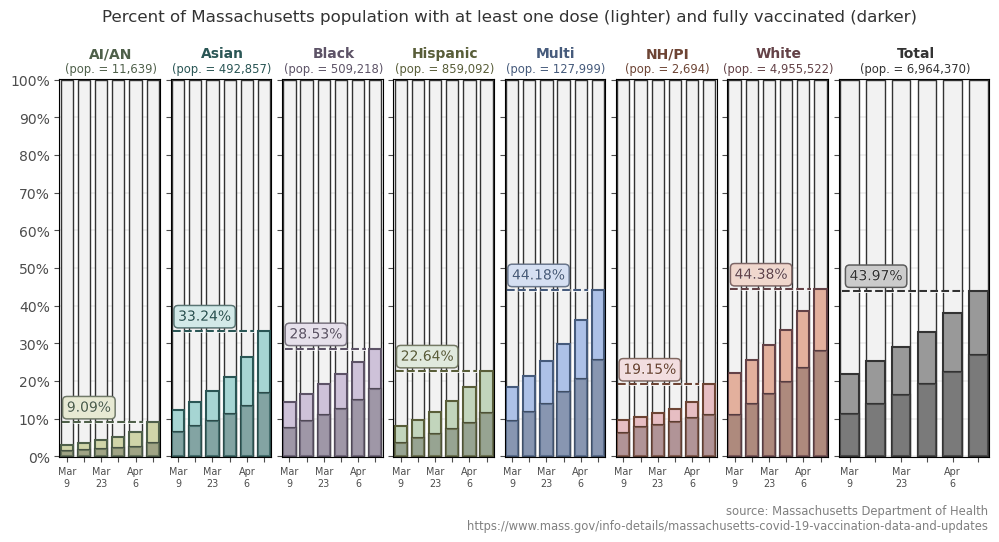

In [50]:
fig, ax = plt.subplots(1,vax_race_dfg['race'].nunique()-1,figsize=(12,5),dpi=100,sharey=True,sharex=True,
                       gridspec_kw={'width_ratios':[1]*(vax_race_dfg['race'].nunique()-2)+[1.5]})
plt.subplots_adjust(wspace=0.1)

colors = ["#d0d5a9","#a6d5d3","#cec2d9","#c2d5bc","#adc1e7","#e7bec3","#e3b09d"] + ['.6']
color_d = ["#4f604a","#2a5655","#5d5367","#595e39","#465b7c","#6d4434","#644247"]+['.2']

for ai,ag in enumerate(['AI/AN', 'Asian', 'Black', 'Hispanic', 'Multi', 'NH/PI', 'White', 'Total']):
    vig = vax_race_dfg.loc[vax_race_dfg['race']==ag].copy()
    
    ax[ai].bar([date_dict[i] for i in vig['date']], 1,
           fc='.95', ec='.2', width=5, linestyle='-', lw=1)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['atleast_onedose']/vig['population']).tolist(),
               width=5, ec=color_d[ai], color=colors[ai], lw=1.5)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, color='.2', lw=1.5, ec='.2')
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, ec=color_d[ai], alpha=0.7, color=colors[ai], lw=1.5)

    vmax = (vig['atleast_onedose']/vig['population']).max()
    ax[ai].hlines(vmax, date_dict[vax_age_dfg['date'].min()]-2, date_dict[vax_age_dfg['date'].max()]-4,
                  lw=1.5, color=color_d[ai], linestyle='--',
                  path_effects=[path_effects.Stroke(linewidth=2, foreground='w'),
                                path_effects.Normal()])

    props = dict(boxstyle='round', fc='w', alpha=0.999, ec='.5')
    ax[ai].text(date_dict[vax_age_dfg['date'].min()], vmax+0.02, '%.2f%%'%(100*vmax),
                ha='left', va='bottom', fontsize='medium',color='w', bbox=props)
    props = dict(boxstyle='round', fc=colors[ai], alpha=0.5, ec=color_d[ai])
    ax[ai].text(date_dict[vax_age_dfg['date'].min()], vmax+0.02, '%.2f%%'%(100*vmax),
                ha='left', va='bottom', fontsize='medium',color=color_d[ai],
                path_effects=[path_effects.Stroke(linewidth=0.5, foreground='w'),
                              path_effects.Normal()], bbox=props)

    ax[ai].set_yticks(np.linspace(0,1,11))
    ax[ai].set_ylim(-0.001, 1.001)
    ax[ai].text(0.51, 1.05, ag, ha='center', va='bottom', transform=ax[ai].transAxes,
                fontsize='medium',color=color_d[ai], fontweight='bold')
    ax[ai].text(0.51, 1.01, "(pop. = {:,})".format(vig['population'].astype(int).unique()[0]),
                ha='center', va='bottom', transform=ax[ai].transAxes, fontsize='small',color=color_d[ai])
    
#     ax[ai].set_title(ag, color=color_d[ai],
#                      ha='center', fontsize='medium', fontweight='bold')

    
dates_tt = [date_dict[i] for i in vig['date']]
dates_ll = ['Mar\n9', '', 'Mar\n23', '', 'Apr\n6','']#,'Apr\n20']

ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
plt.suptitle('Percent of Massachusetts population with at least'+\
             ' one dose (lighter) and fully vaccinated (darker)', color='.2', y=1.02)

for ai,a in enumerate(fig.axes):
    a.set_xticks(dates_tt)
    a.set_xticklabels(dates_ll, fontsize='x-small')

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_xlim(date_dict[vax_race_dfg['date'].min()]-3,
               date_dict[vax_race_dfg['date'].max()]+3)

ax[-1].text(0.99,-0.125,'source: Massachusetts Department of Health\n'+\
        'https://www.mass.gov/info-details/massachusetts-covid-19-vaccination-data-and-updates',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[-1].transAxes)

plt.savefig('../figs/pngs/massachusetts_vaccine_race.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_vaccine_race.pdf',bbox_inches='tight')

plt.show()